In [1]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Object masks in images from prompts with SAM 2


Segment Anything Model 2 (SAM 2) predicts object masks given prompts that indicate the desired object. The model first converts the image into an image embedding that allows high quality masks to be efficiently produced from a prompt.

The `SAM2ImagePredictor` class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the `set_image` method, which calculates the necessary image embeddings. Then, prompts can be provided via the `predict` method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.


<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/sam2/blob/main/notebooks/image_predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>


## Environment Set-up


If running locally using jupyter, first install `sam2` in your environment using the [installation instructions](https://github.com/facebookresearch/sam2#installation) in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).


In [2]:
using_colab = False

In [4]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    !mkdir -p images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/truck.jpg
    !wget -P images https://raw.githubusercontent.com/facebookresearch/sam2/main/notebooks/images/groceries.jpg

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

## Set-up


Necessary imports and helper functions for displaying points, boxes, and masks.


In [5]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [6]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [15]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])   # light blue
        #color = np.array([1.0, 0.0, 0.0, 0.6])  # red
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        print(f"Mask shape: {mask.shape}")
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

## Example image


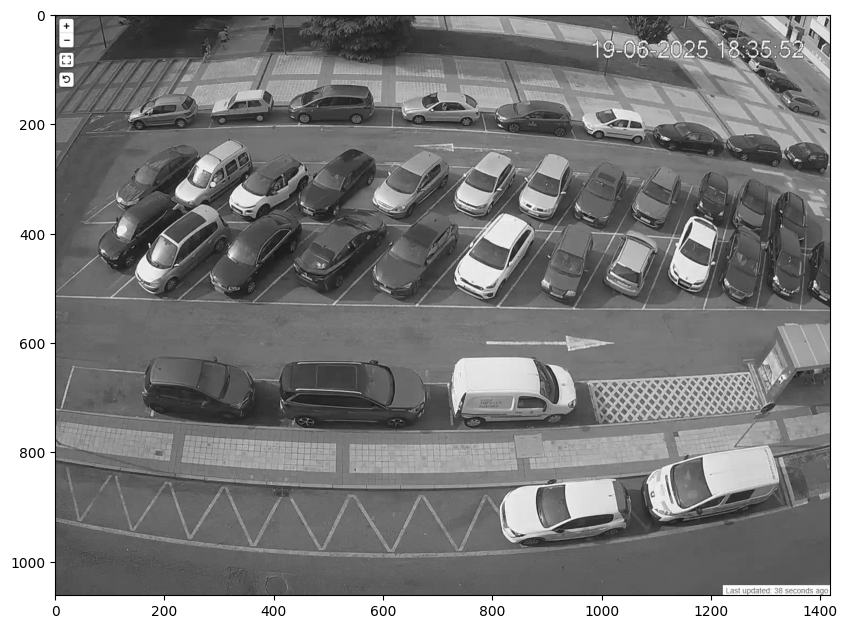

In [ ]:
image = Image.open('parquery/frame_60700.jpg')
image = np.array(image.convert("L"))  # Convert to grayscale
plt.figure(figsize=(10, 10))
plt.imshow(image, cmap='gray')
plt.axis('on')
plt.show()

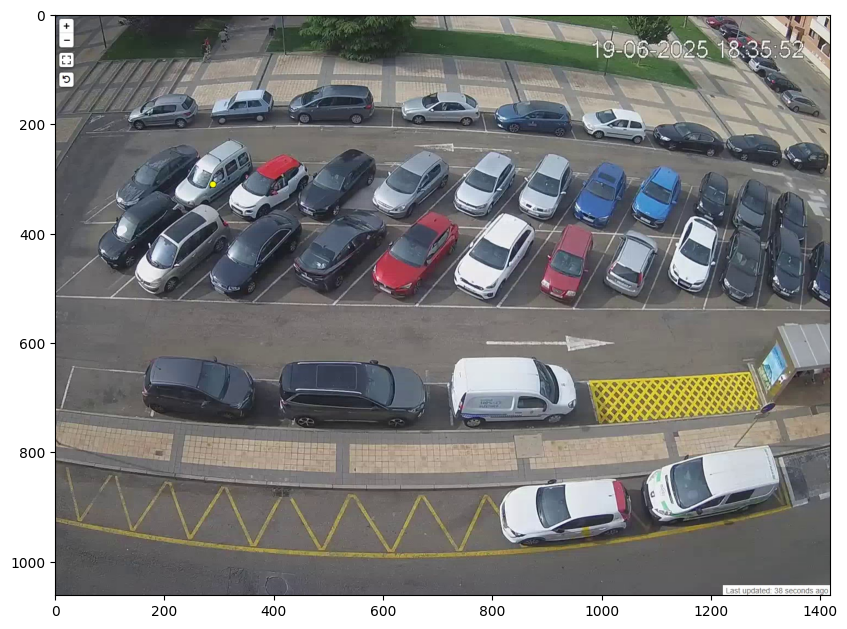

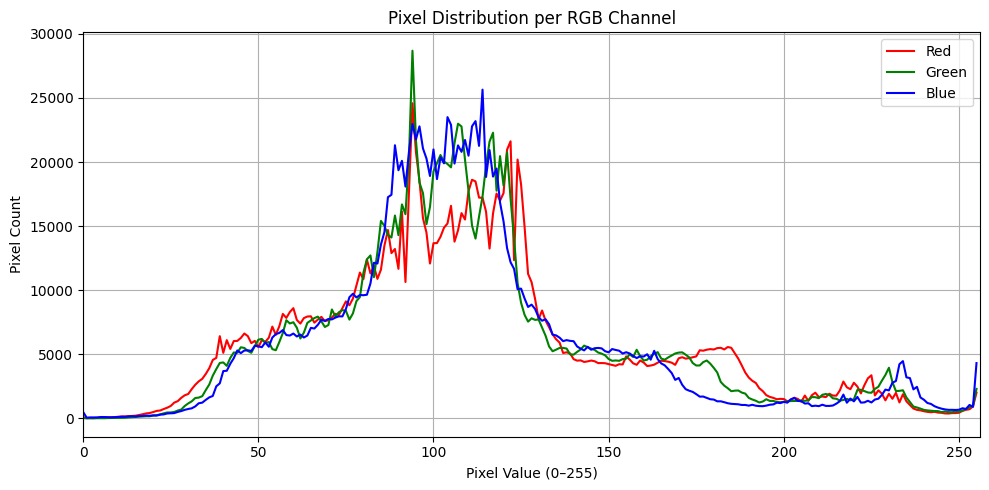

In [69]:
import cv2
from collections import Counter

#image = Image.open('parquery/frame_200000.jpg')
image = Image.open('parquery/frame_00000.jpg')
image_np = np.array(image.convert("RGB"))
image = np.array(image.convert("RGB"))

plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('on')
plt.show()

colors = ('r', 'g', 'b')
channel_names = ('Red', 'Green', 'Blue')

plt.figure(figsize=(10, 5))
for i, color in enumerate(colors):
    hist = cv2.calcHist([image_np], [i], None, [256], [0, 256])
    plt.plot(hist, color=color, label=channel_names[i])
    plt.xlim([0, 256])

plt.title("Pixel Distribution per RGB Channel")
plt.xlabel("Pixel Value (0–255)")
plt.ylabel("Pixel Count")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Selecting objects with SAM 2


First, load the SAM 2 model and predictor. Change the path below to point to the SAM 2 checkpoint. Running on CUDA and using the default model are recommended for best results.


In [12]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = "../checkpoints/sam2_hiera_large.pt"
model_cfg = "../sam2/configs/sam2/sam2_hiera_l.yaml"

sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

predictor = SAM2ImagePredictor(sam2_model)

Process the image to produce an image embedding by calling `SAM2ImagePredictor.set_image`. `SAM2ImagePredictor` remembers this embedding and will use it for subsequent mask prediction.


In [16]:
gray_rgb = np.stack([image, image, image], axis=-1).astype(np.uint8)
predictor.set_image(gray_rgb)

In [65]:

predictor.set_image(image)

To select the truck, choose a point on it. Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0 (background point). Multiple points can be input; here we use only one. The chosen point will be shown as a star on the image.


In [59]:
input_points = np.array([
    [206, 182],  #A1 0
    [356, 175],  #A2 1
    [528, 177],  #A3 2
    [711, 183],  #A4 3
    [882, 200],  #A5 4
    [1033, 213], #A6 5
    [1174, 242], #A7 6
    [1270, 250], #A8 7
    [1380, 270], #A9 8

    [173, 296],  #B1 9
    [289, 297],  #B2 10
    [389, 297],  #B3 11 
    [487, 326],  #B4 12 
    [644, 309],  #B5 13
    [780, 315],  #B6 14
    [903, 315],  #B7 15
    [987, 351],  #B8 16
    [1100, 340], #B9 17
    [1206, 340], #B10 18
    [1278, 356], #B11 19
    [1350, 363], #B12 20

    [124, 418],  #C1 21
    [241, 416],  #C2 22
    [377, 424],  #C3 23
    [521, 433],  #C4 24
    [664, 438],  #C5 25
    [803, 435],  #C6 26
    [942, 445],  #C7 27
    [1058, 459], #C8 28
    [1158, 470], #C9 29
    [1260, 462], #C10 30
    [1340, 468], #C11 31
    [1403, 470], #C12 32

    [101, 687],  #D1 33
    [284, 670],  #D2 34
    [559, 685],  #D3 35
    [817, 679],  #D4 36
])
input_label = np.array([1])

In [22]:
print(predictor._features["image_embed"].shape, predictor._features["image_embed"][-1].shape)

torch.Size([1, 256, 64, 64]) torch.Size([256, 64, 64])


Predict with `SAM2ImagePredictor.predict`. The model returns masks, quality predictions for those masks, and low resolution mask logits that can be passed to the next iteration of prediction.


첫 번째 마스크의 픽셀 개수: 6151
첫 번째 마스크의 픽셀 개수: 6151.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(67), np.uint8(71), np.uint8(83)) → 15 픽셀
색상 (np.uint8(73), np.uint8(81), np.uint8(94)) → 15 픽셀
색상 (np.uint8(135), np.uint8(146), np.uint8(164)) → 14 픽셀
색상 (np.uint8(71), np.uint8(79), np.uint8(92)) → 14 픽셀
색상 (np.uint8(127), np.uint8(140), np.uint8(159)) → 13 픽셀
색상 (np.uint8(65), np.uint8(74), np.uint8(91)) → 13 픽셀
색상 (np.uint8(66), np.uint8(70), np.uint8(82)) → 12 픽셀
색상 (np.uint8(95), np.uint8(108), np.uint8(125)) → 11 픽셀
색상 (np.uint8(66), np.uint8(72), np.uint8(84)) → 11 픽셀
색상 (np.uint8(69), np.uint8(74), np.uint8(80)) → 11 픽셀
idx: 1, [O] Occupied Count: 1, Empty Count: 0, slot=A1, Score=0.957, width=128, height=66
idx: 1, [O] Occupied Count: 1, Empty Count: 0, 색상수=3654, 채도편차=29.20, 비율=1.94


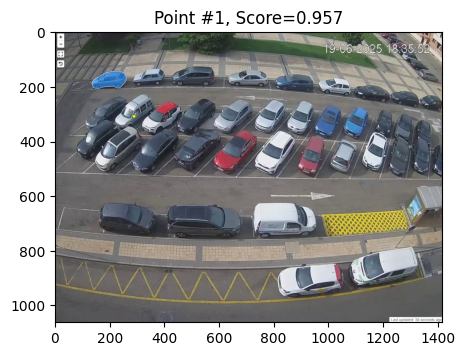

C:\Users\walkb\AppData\Local\Temp\ipykernel_81188\976812272.py:178: UserWarning: Glyph 54589 (\N{HANGUL SYLLABLE PIG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\walkb\AppData\Local\Temp\ipykernel_81188\976812272.py:178: UserWarning: Glyph 49472 (\N{HANGUL SYLLABLE SEL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\walkb\AppData\Local\Temp\ipykernel_81188\976812272.py:178: UserWarning: Glyph 44050 (\N{HANGUL SYLLABLE GABS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\walkb\AppData\Local\Temp\ipykernel_81188\976812272.py:178: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\walkb\AppData\Local\Temp\ipykernel_81188\976812272.py:178: UserWarning: Glyph 52292 (\N{HANGUL SYLLABLE CAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\walkb\AppData\Local\Temp\ipykernel_81188\976812272.py:178: UserWarning: Glyph 45328 (\N{HANGUL SYLLABLE NEOL}) missing fr

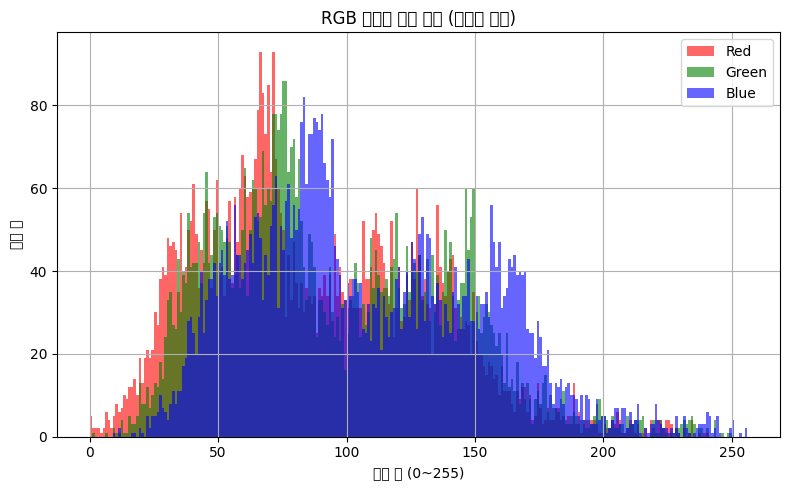

첫 번째 마스크의 픽셀 개수: 5402
첫 번째 마스크의 픽셀 개수: 5402.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(189), np.uint8(207), np.uint8(229)) → 28 픽셀
색상 (np.uint8(190), np.uint8(208), np.uint8(228)) → 28 픽셀
색상 (np.uint8(188), np.uint8(206), np.uint8(226)) → 28 픽셀
색상 (np.uint8(187), np.uint8(205), np.uint8(227)) → 22 픽셀
색상 (np.uint8(188), np.uint8(206), np.uint8(228)) → 22 픽셀
색상 (np.uint8(102), np.uint8(120), np.uint8(144)) → 19 픽셀
색상 (np.uint8(189), np.uint8(207), np.uint8(227)) → 18 픽셀
색상 (np.uint8(187), np.uint8(204), np.uint8(224)) → 17 픽셀
색상 (np.uint8(188), np.uint8(205), np.uint8(225)) → 13 픽셀
색상 (np.uint8(186), np.uint8(202), np.uint8(217)) → 12 픽셀
idx: 2, [O] Occupied Count: 2, Empty Count: 0, slot=A2, Score=0.945, width=116, height=65
idx: 2, [O] Occupied Count: 2, Empty Count: 0, 색상수=3446, 채도편차=34.27, 비율=1.78


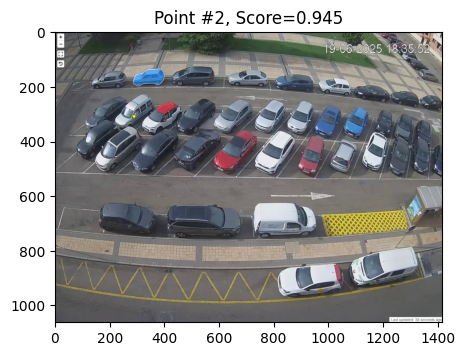

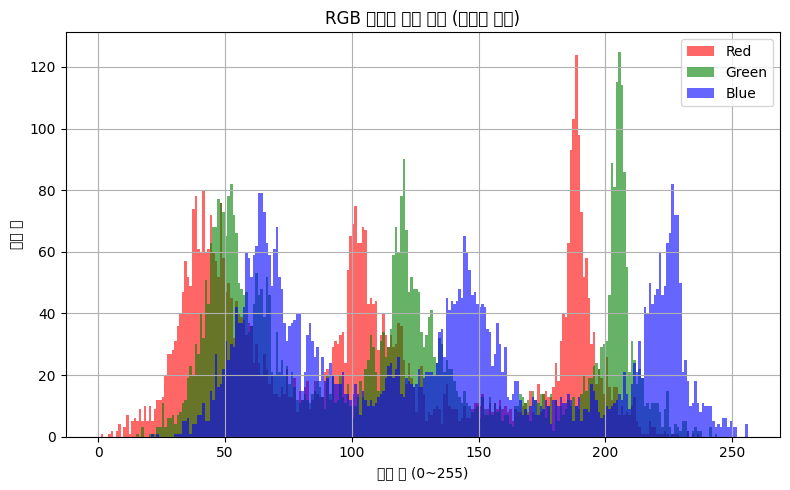

첫 번째 마스크의 픽셀 개수: 9432
첫 번째 마스크의 픽셀 개수: 9432.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(56), np.uint8(60), np.uint8(72)) → 71 픽셀
색상 (np.uint8(56), np.uint8(59), np.uint8(68)) → 58 픽셀
색상 (np.uint8(54), np.uint8(60), np.uint8(74)) → 53 픽셀
색상 (np.uint8(53), np.uint8(61), np.uint8(74)) → 47 픽셀
색상 (np.uint8(54), np.uint8(60), np.uint8(72)) → 44 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(68)) → 42 픽셀
색상 (np.uint8(58), np.uint8(58), np.uint8(66)) → 37 픽셀
색상 (np.uint8(57), np.uint8(61), np.uint8(73)) → 34 픽셀
색상 (np.uint8(57), np.uint8(60), np.uint8(69)) → 34 픽셀
색상 (np.uint8(42), np.uint8(45), np.uint8(52)) → 34 픽셀
idx: 3, [O] Occupied Count: 3, Empty Count: 0, slot=A3, Score=0.969, width=158, height=73
idx: 3, [O] Occupied Count: 3, Empty Count: 0, 색상수=4127, 채도편차=27.22, 비율=2.16


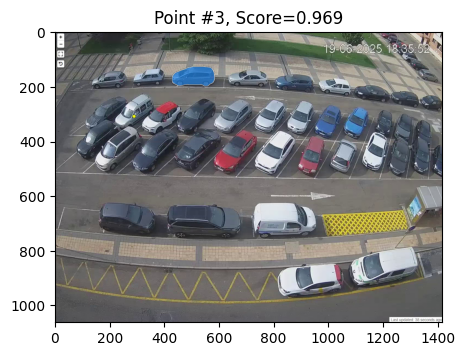

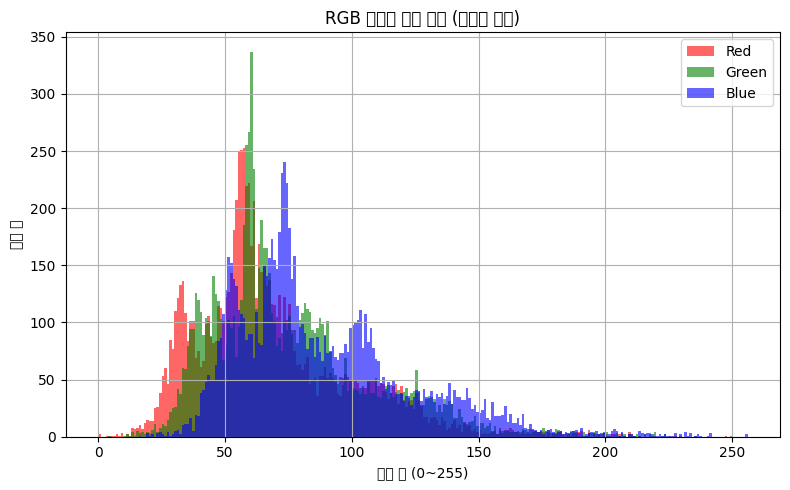

첫 번째 마스크의 픽셀 개수: 7164
첫 번째 마스크의 픽셀 개수: 7164.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(158), np.uint8(173), np.uint8(180)) → 30 픽셀
색상 (np.uint8(156), np.uint8(171), np.uint8(176)) → 28 픽셀
색상 (np.uint8(159), np.uint8(172), np.uint8(180)) → 27 픽셀
색상 (np.uint8(150), np.uint8(167), np.uint8(177)) → 21 픽셀
색상 (np.uint8(95), np.uint8(104), np.uint8(113)) → 17 픽셀
색상 (np.uint8(97), np.uint8(104), np.uint8(114)) → 17 픽셀
색상 (np.uint8(165), np.uint8(174), np.uint8(183)) → 16 픽셀
색상 (np.uint8(95), np.uint8(102), np.uint8(112)) → 16 픽셀
색상 (np.uint8(157), np.uint8(174), np.uint8(184)) → 15 픽셀
색상 (np.uint8(164), np.uint8(171), np.uint8(181)) → 14 픽셀
idx: 4, [O] Occupied Count: 4, Empty Count: 0, slot=A4, Score=0.965, width=145, height=64
idx: 4, [O] Occupied Count: 4, Empty Count: 0, 색상수=3885, 채도편차=28.37, 비율=2.27


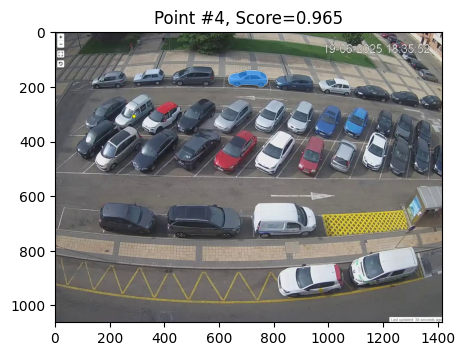

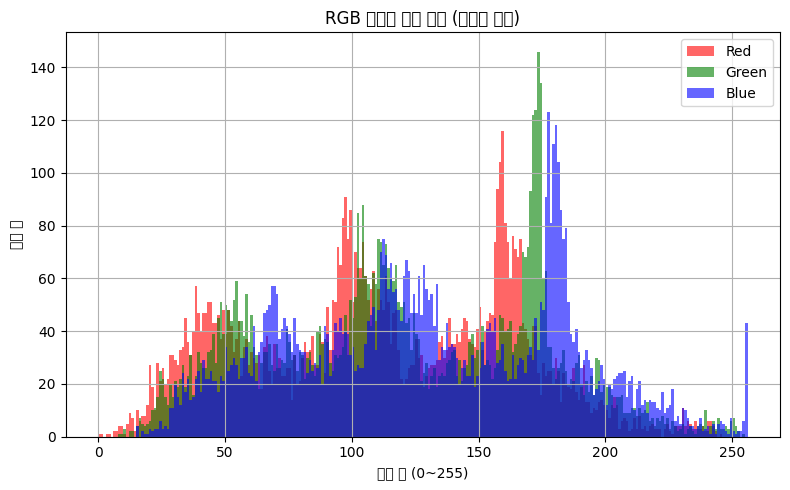

첫 번째 마스크의 픽셀 개수: 7455
첫 번째 마스크의 픽셀 개수: 7455.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(46), np.uint8(54), np.uint8(67)) → 38 픽셀
색상 (np.uint8(46), np.uint8(57), np.uint8(77)) → 27 픽셀
색상 (np.uint8(47), np.uint8(55), np.uint8(68)) → 27 픽셀
색상 (np.uint8(46), np.uint8(57), np.uint8(75)) → 25 픽셀
색상 (np.uint8(48), np.uint8(56), np.uint8(69)) → 24 픽셀
색상 (np.uint8(43), np.uint8(54), np.uint8(74)) → 23 픽셀
색상 (np.uint8(47), np.uint8(58), np.uint8(78)) → 22 픽셀
색상 (np.uint8(49), np.uint8(60), np.uint8(80)) → 19 픽셀
색상 (np.uint8(44), np.uint8(55), np.uint8(73)) → 17 픽셀
색상 (np.uint8(50), np.uint8(57), np.uint8(73)) → 16 픽셀
idx: 5, [O] Occupied Count: 5, Empty Count: 0, slot=A5, Score=0.965, width=142, height=67
idx: 5, [O] Occupied Count: 5, Empty Count: 0, 색상수=4472, 채도편차=33.40, 비율=2.12


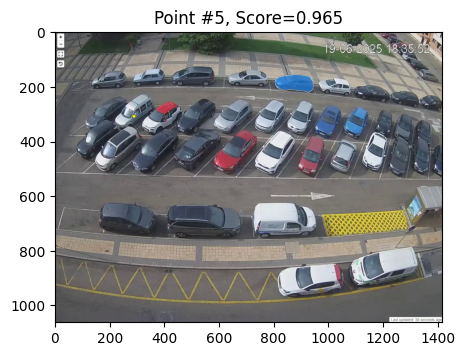

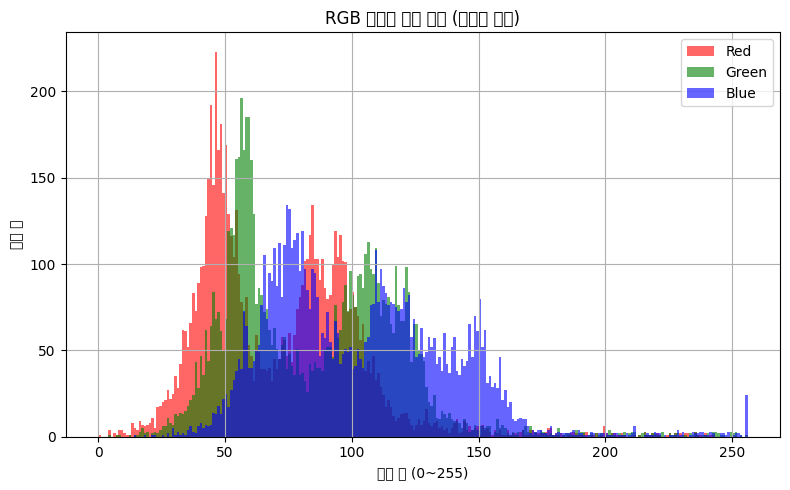

첫 번째 마스크의 픽셀 개수: 5767
첫 번째 마스크의 픽셀 개수: 5767.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(222), np.uint8(229), np.uint8(237)) → 22 픽셀
색상 (np.uint8(220), np.uint8(227), np.uint8(235)) → 22 픽셀
색상 (np.uint8(216), np.uint8(225), np.uint8(232)) → 20 픽셀
색상 (np.uint8(89), np.uint8(108), np.uint8(123)) → 19 픽셀
색상 (np.uint8(133), np.uint8(145), np.uint8(159)) → 18 픽셀
색상 (np.uint8(215), np.uint8(224), np.uint8(231)) → 17 픽셀
색상 (np.uint8(218), np.uint8(227), np.uint8(234)) → 17 픽셀
색상 (np.uint8(132), np.uint8(144), np.uint8(156)) → 17 픽셀
색상 (np.uint8(133), np.uint8(145), np.uint8(157)) → 16 픽셀
색상 (np.uint8(134), np.uint8(146), np.uint8(160)) → 16 픽셀
idx: 6, [O] Occupied Count: 6, Empty Count: 0, slot=A6, Score=0.957, width=119, height=67
idx: 6, [O] Occupied Count: 6, Empty Count: 0, 색상수=3500, 채도편차=27.74, 비율=1.78


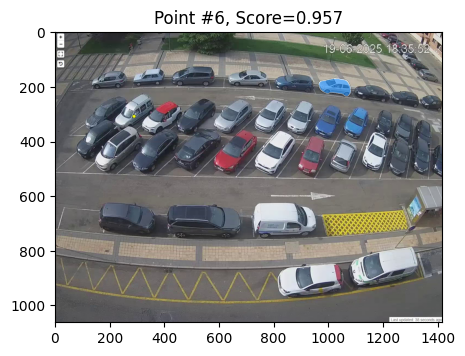

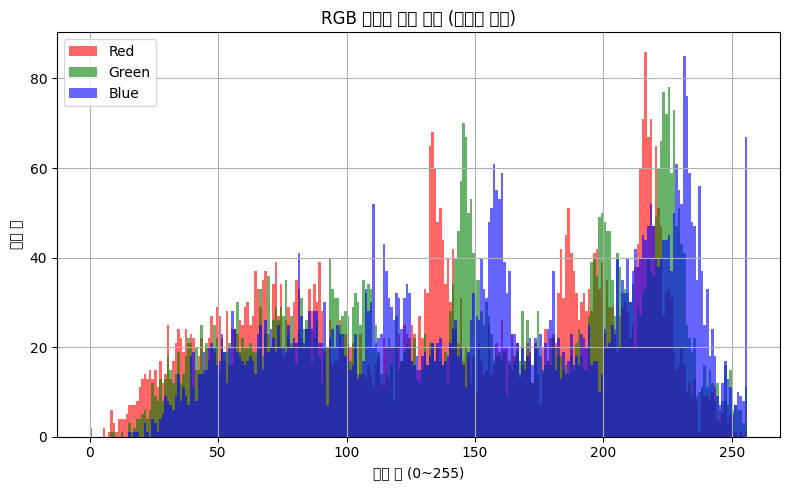

첫 번째 마스크의 픽셀 개수: 6031
첫 번째 마스크의 픽셀 개수: 6031.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(43), np.uint8(44), np.uint8(49)) → 30 픽셀
색상 (np.uint8(40), np.uint8(43), np.uint8(48)) → 28 픽셀
색상 (np.uint8(39), np.uint8(44), np.uint8(50)) → 28 픽셀
색상 (np.uint8(44), np.uint8(47), np.uint8(52)) → 27 픽셀
색상 (np.uint8(37), np.uint8(37), np.uint8(45)) → 27 픽셀
색상 (np.uint8(43), np.uint8(46), np.uint8(51)) → 27 픽셀
색상 (np.uint8(42), np.uint8(45), np.uint8(50)) → 26 픽셀
색상 (np.uint8(39), np.uint8(42), np.uint8(47)) → 25 픽셀
색상 (np.uint8(41), np.uint8(44), np.uint8(49)) → 24 픽셀
색상 (np.uint8(37), np.uint8(40), np.uint8(49)) → 23 픽셀
idx: 7, [O] Occupied Count: 7, Empty Count: 0, slot=A7, Score=0.953, width=132, height=64
idx: 7, [O] Occupied Count: 7, Empty Count: 0, 색상수=2902, 채도편차=21.35, 비율=2.06


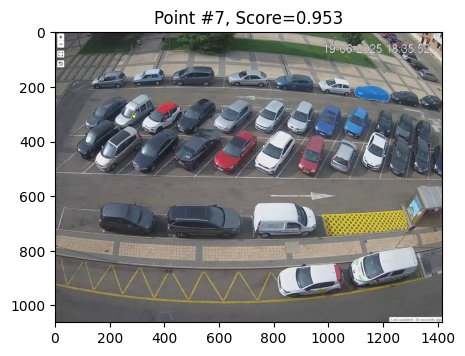

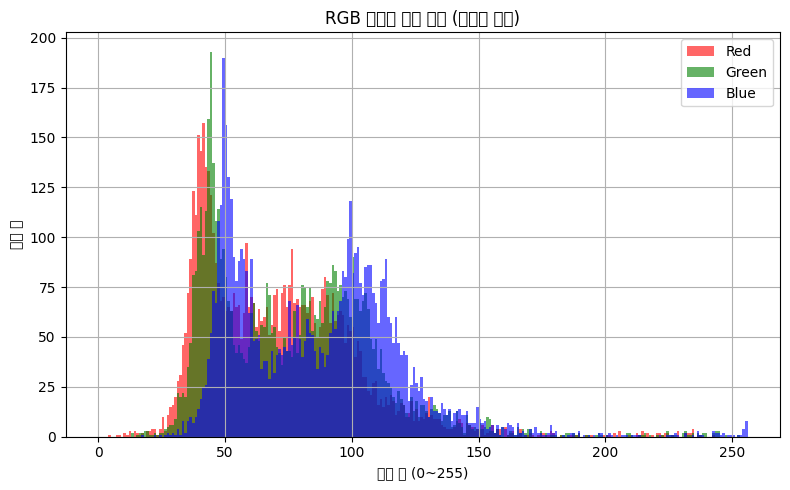

첫 번째 마스크의 픽셀 개수: 4608
첫 번째 마스크의 픽셀 개수: 4608.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(47), np.uint8(50), np.uint8(59)) → 81 픽셀
색상 (np.uint8(42), np.uint8(45), np.uint8(54)) → 71 픽셀
색상 (np.uint8(48), np.uint8(51), np.uint8(60)) → 69 픽셀
색상 (np.uint8(47), np.uint8(51), np.uint8(60)) → 64 픽셀
색상 (np.uint8(46), np.uint8(50), np.uint8(59)) → 54 픽셀
색상 (np.uint8(43), np.uint8(46), np.uint8(55)) → 49 픽셀
색상 (np.uint8(45), np.uint8(49), np.uint8(58)) → 37 픽셀
색상 (np.uint8(46), np.uint8(49), np.uint8(58)) → 33 픽셀
색상 (np.uint8(45), np.uint8(50), np.uint8(56)) → 29 픽셀
색상 (np.uint8(47), np.uint8(52), np.uint8(58)) → 28 픽셀
idx: 8, [O] Occupied Count: 8, Empty Count: 0, slot=A8, Score=0.934, width=104, height=61
idx: 8, [O] Occupied Count: 8, Empty Count: 0, 색상수=2116, 채도편차=21.07, 비율=1.70


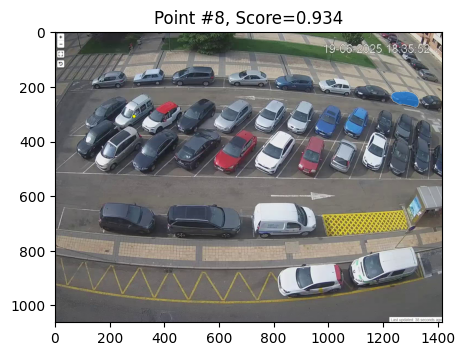

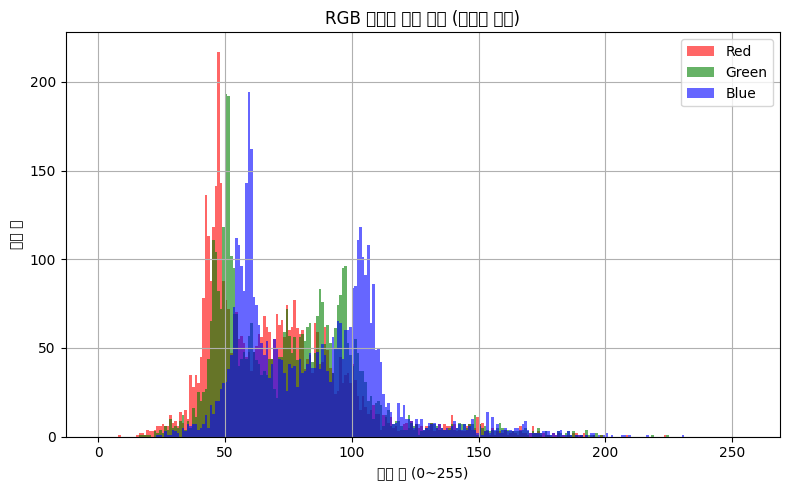

첫 번째 마스크의 픽셀 개수: 3555
첫 번째 마스크의 픽셀 개수: 3555.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(44), np.uint8(45), np.uint8(50)) → 37 픽셀
색상 (np.uint8(48), np.uint8(48), np.uint8(56)) → 29 픽셀
색상 (np.uint8(46), np.uint8(49), np.uint8(56)) → 27 픽셀
색상 (np.uint8(42), np.uint8(45), np.uint8(50)) → 27 픽셀
색상 (np.uint8(49), np.uint8(49), np.uint8(57)) → 26 픽셀
색상 (np.uint8(43), np.uint8(44), np.uint8(49)) → 20 픽셀
색상 (np.uint8(64), np.uint8(75), np.uint8(95)) → 19 픽셀
색상 (np.uint8(59), np.uint8(58), np.uint8(63)) → 19 픽셀
색상 (np.uint8(58), np.uint8(57), np.uint8(62)) → 17 픽셀
색상 (np.uint8(45), np.uint8(48), np.uint8(55)) → 15 픽셀
idx: 9, [O] Occupied Count: 9, Empty Count: 0, slot=A9, Score=0.941, width=85, height=59
idx: 9, [O] Occupied Count: 9, Empty Count: 0, 색상수=2282, 채도편차=23.34, 비율=1.44


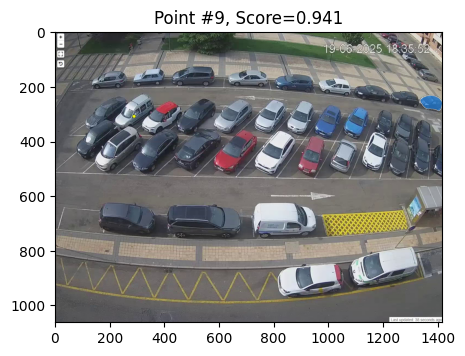

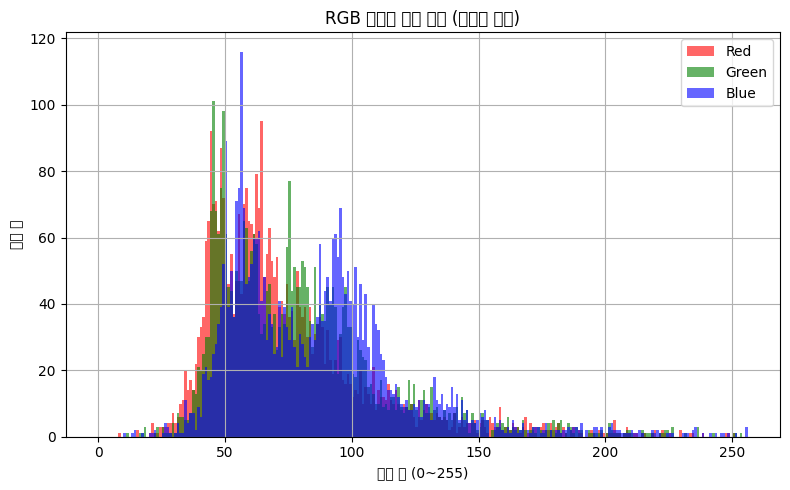

첫 번째 마스크의 픽셀 개수: 8792
첫 번째 마스크의 픽셀 개수: 8792.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(31), np.uint8(41), np.uint8(53)) → 69 픽셀
색상 (np.uint8(32), np.uint8(42), np.uint8(54)) → 59 픽셀
색상 (np.uint8(61), np.uint8(74), np.uint8(91)) → 50 픽셀
색상 (np.uint8(46), np.uint8(60), np.uint8(69)) → 41 픽셀
색상 (np.uint8(60), np.uint8(73), np.uint8(90)) → 34 픽셀
색상 (np.uint8(85), np.uint8(93), np.uint8(104)) → 33 픽셀
색상 (np.uint8(34), np.uint8(38), np.uint8(50)) → 31 픽셀
색상 (np.uint8(45), np.uint8(59), np.uint8(68)) → 28 픽셀
색상 (np.uint8(81), np.uint8(97), np.uint8(113)) → 27 픽셀
색상 (np.uint8(77), np.uint8(87), np.uint8(97)) → 24 픽셀
idx: 10, [O] Occupied Count: 10, Empty Count: 0, slot=B1, Score=0.828, width=152, height=119
idx: 10, [O] Occupied Count: 10, Empty Count: 0, 색상수=3097, 채도편차=24.97, 비율=1.28


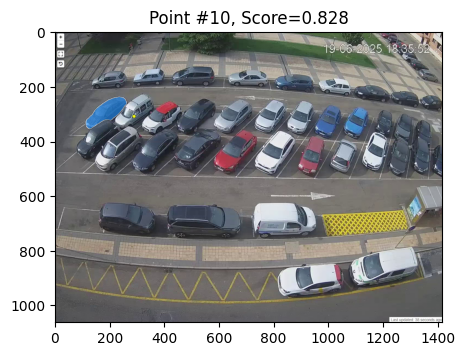

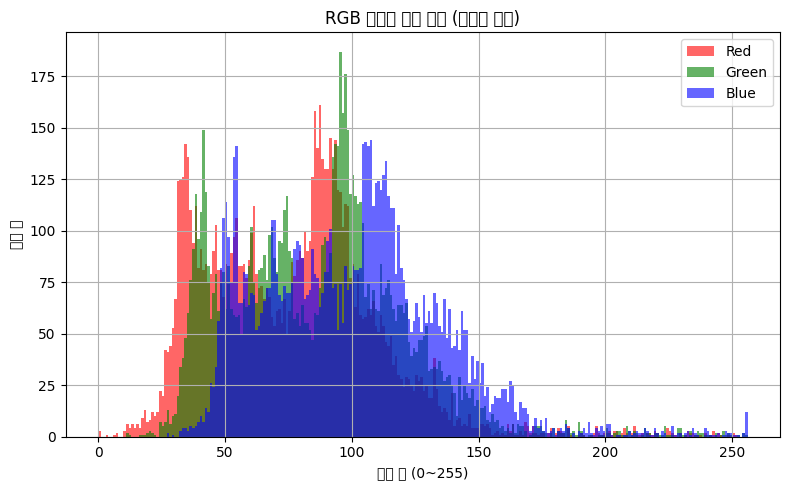

첫 번째 마스크의 픽셀 개수: 10426
첫 번째 마스크의 픽셀 개수: 10426.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(167), np.uint8(181), np.uint8(190)) → 35 픽셀
색상 (np.uint8(229), np.uint8(233), np.uint8(242)) → 29 픽셀
색상 (np.uint8(165), np.uint8(182), np.uint8(192)) → 26 픽셀
색상 (np.uint8(228), np.uint8(232), np.uint8(241)) → 26 픽셀
색상 (np.uint8(173), np.uint8(187), np.uint8(198)) → 22 픽셀
색상 (np.uint8(171), np.uint8(188), np.uint8(198)) → 21 픽셀
색상 (np.uint8(172), np.uint8(188), np.uint8(203)) → 20 픽셀
색상 (np.uint8(198), np.uint8(212), np.uint8(221)) → 19 픽셀
색상 (np.uint8(164), np.uint8(181), np.uint8(191)) → 18 픽셀
색상 (np.uint8(167), np.uint8(181), np.uint8(192)) → 17 픽셀
idx: 11, [O] Occupied Count: 11, Empty Count: 0, slot=B2, Score=0.965, width=144, height=128
idx: 11, [O] Occupied Count: 11, Empty Count: 0, 색상수=5829, 채도편차=37.48, 비율=1.12


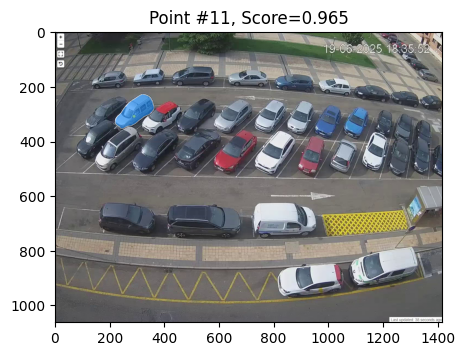

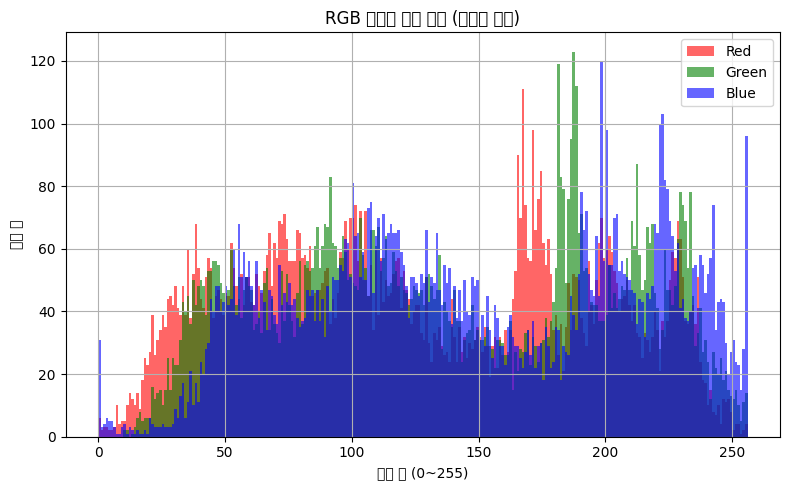

첫 번째 마스크의 픽셀 개수: 10564
첫 번째 마스크의 픽셀 개수: 10564.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(226), np.uint8(231), np.uint8(237)) → 55 픽셀
색상 (np.uint8(225), np.uint8(230), np.uint8(236)) → 52 픽셀
색상 (np.uint8(229), np.uint8(234), np.uint8(240)) → 50 픽셀
색상 (np.uint8(98), np.uint8(115), np.uint8(133)) → 40 픽셀
색상 (np.uint8(97), np.uint8(114), np.uint8(132)) → 36 픽셀
색상 (np.uint8(192), np.uint8(59), np.uint8(80)) → 35 픽셀
색상 (np.uint8(227), np.uint8(230), np.uint8(235)) → 34 픽셀
색상 (np.uint8(95), np.uint8(112), np.uint8(130)) → 33 픽셀
색상 (np.uint8(223), np.uint8(228), np.uint8(234)) → 33 픽셀
색상 (np.uint8(193), np.uint8(58), np.uint8(73)) → 32 픽셀
idx: 12, [O] Occupied Count: 12, Empty Count: 0, slot=B3, Score=0.938, width=148, height=120
idx: 12, [O] Occupied Count: 12, Empty Count: 0, 색상수=6212, 채도편차=54.89, 비율=1.23


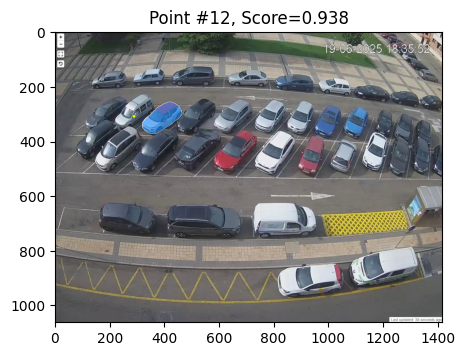

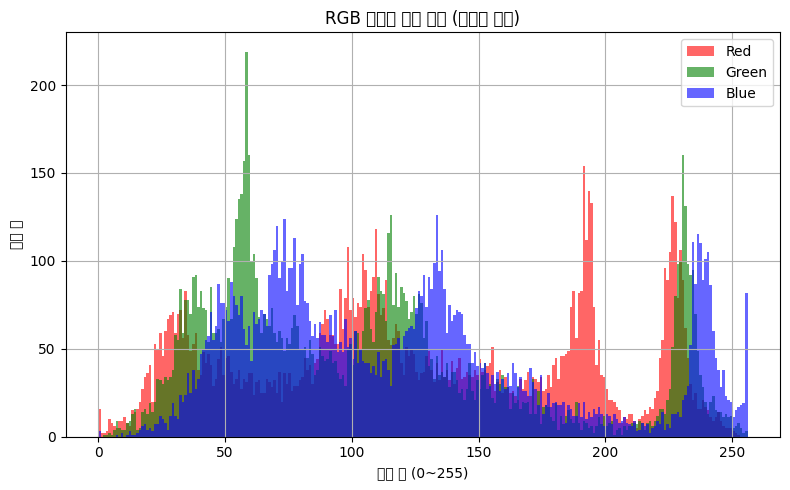

첫 번째 마스크의 픽셀 개수: 10830
첫 번째 마스크의 픽셀 개수: 10830.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(226), np.uint8(231), np.uint8(237)) → 55 픽셀
색상 (np.uint8(225), np.uint8(230), np.uint8(236)) → 52 픽셀
색상 (np.uint8(229), np.uint8(234), np.uint8(240)) → 50 픽셀
색상 (np.uint8(98), np.uint8(115), np.uint8(133)) → 40 픽셀
색상 (np.uint8(97), np.uint8(114), np.uint8(132)) → 36 픽셀
색상 (np.uint8(192), np.uint8(59), np.uint8(80)) → 35 픽셀
색상 (np.uint8(227), np.uint8(230), np.uint8(235)) → 34 픽셀
색상 (np.uint8(95), np.uint8(112), np.uint8(130)) → 33 픽셀
색상 (np.uint8(223), np.uint8(228), np.uint8(234)) → 33 픽셀
색상 (np.uint8(193), np.uint8(58), np.uint8(73)) → 32 픽셀
idx: 13, [O] Occupied Count: 13, Empty Count: 0


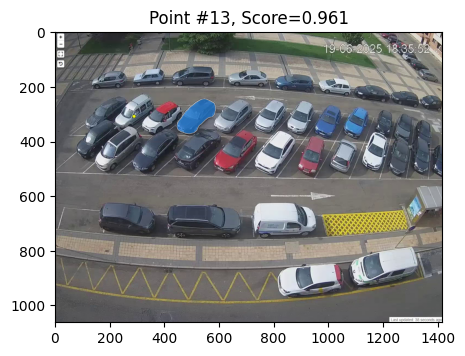

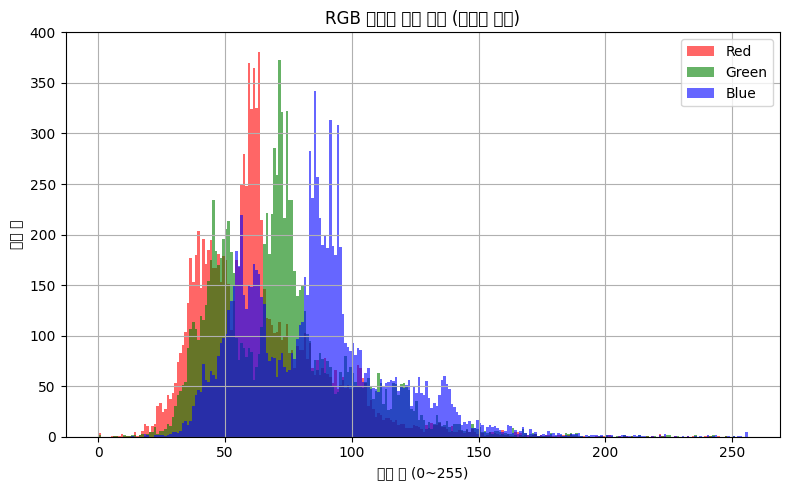

첫 번째 마스크의 픽셀 개수: 10403
첫 번째 마스크의 픽셀 개수: 10403.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(145), np.uint8(158), np.uint8(175)) → 52 픽셀
색상 (np.uint8(75), np.uint8(90), np.uint8(109)) → 49 픽셀
색상 (np.uint8(82), np.uint8(95), np.uint8(112)) → 47 픽셀
색상 (np.uint8(81), np.uint8(94), np.uint8(111)) → 45 픽셀
색상 (np.uint8(141), np.uint8(154), np.uint8(171)) → 44 픽셀
색상 (np.uint8(140), np.uint8(153), np.uint8(170)) → 43 픽셀
색상 (np.uint8(144), np.uint8(157), np.uint8(174)) → 42 픽셀
색상 (np.uint8(89), np.uint8(105), np.uint8(121)) → 39 픽셀
색상 (np.uint8(168), np.uint8(181), np.uint8(198)) → 39 픽셀
색상 (np.uint8(91), np.uint8(107), np.uint8(123)) → 38 픽셀
idx: 14, [O] Occupied Count: 14, Empty Count: 0, slot=B5, Score=0.926, width=140, height=124
idx: 14, [O] Occupied Count: 14, Empty Count: 0, 색상수=3886, 채도편차=27.05, 비율=1.13


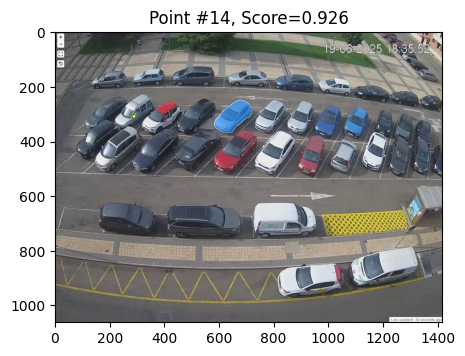

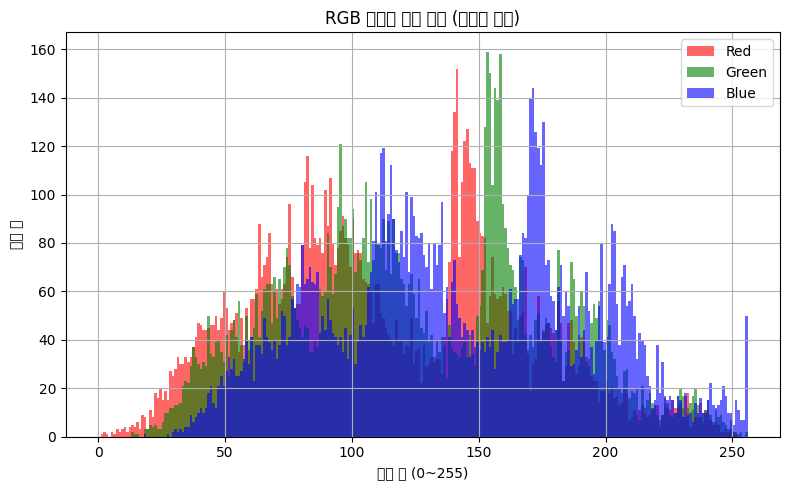

첫 번째 마스크의 픽셀 개수: 8363
첫 번째 마스크의 픽셀 개수: 8363.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(80), np.uint8(96), np.uint8(112)) → 83 픽셀
색상 (np.uint8(165), np.uint8(181), np.uint8(197)) → 65 픽셀
색상 (np.uint8(174), np.uint8(190), np.uint8(206)) → 63 픽셀
색상 (np.uint8(167), np.uint8(183), np.uint8(199)) → 56 픽셀
색상 (np.uint8(81), np.uint8(97), np.uint8(113)) → 54 픽셀
색상 (np.uint8(82), np.uint8(98), np.uint8(114)) → 49 픽셀
색상 (np.uint8(166), np.uint8(182), np.uint8(198)) → 48 픽셀
색상 (np.uint8(167), np.uint8(180), np.uint8(197)) → 43 픽셀
색상 (np.uint8(175), np.uint8(191), np.uint8(207)) → 43 픽셀
색상 (np.uint8(168), np.uint8(184), np.uint8(200)) → 42 픽셀
idx: 15, [O] Occupied Count: 15, Empty Count: 0, slot=B6, Score=0.895, width=111, height=117
idx: 15, [O] Occupied Count: 15, Empty Count: 0, 색상수=3235, 채도편차=28.83, 비율=0.95


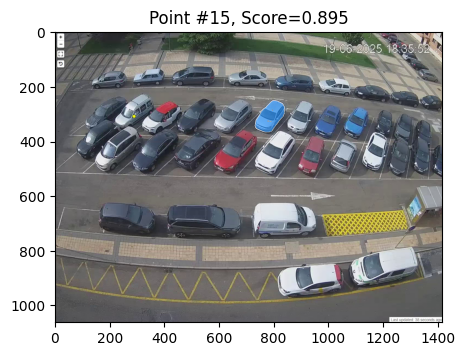

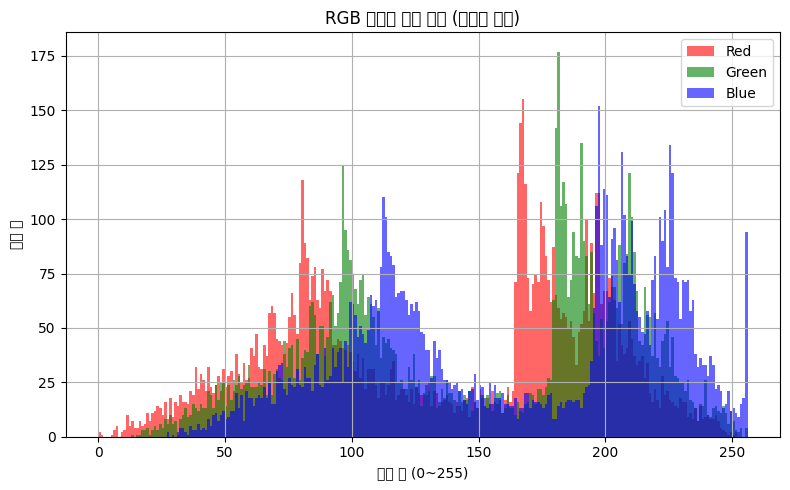

첫 번째 마스크의 픽셀 개수: 7132
첫 번째 마스크의 픽셀 개수: 7132.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(170), np.uint8(188), np.uint8(202)) → 79 픽셀
색상 (np.uint8(182), np.uint8(195), np.uint8(211)) → 78 픽셀
색상 (np.uint8(170), np.uint8(187), np.uint8(203)) → 68 픽셀
색상 (np.uint8(168), np.uint8(186), np.uint8(200)) → 64 픽셀
색상 (np.uint8(168), np.uint8(185), np.uint8(201)) → 63 픽셀
색상 (np.uint8(179), np.uint8(195), np.uint8(211)) → 45 픽셀
색상 (np.uint8(181), np.uint8(197), np.uint8(213)) → 45 픽셀
색상 (np.uint8(171), np.uint8(189), np.uint8(203)) → 43 픽셀
색상 (np.uint8(171), np.uint8(187), np.uint8(203)) → 42 픽셀
색상 (np.uint8(73), np.uint8(92), np.uint8(107)) → 38 픽셀
idx: 16, [O] Occupied Count: 16, Empty Count: 0, slot=B7, Score=0.832, width=95, height=119
idx: 16, [O] Occupied Count: 16, Empty Count: 0, 색상수=3415, 채도편차=26.77, 비율=0.80


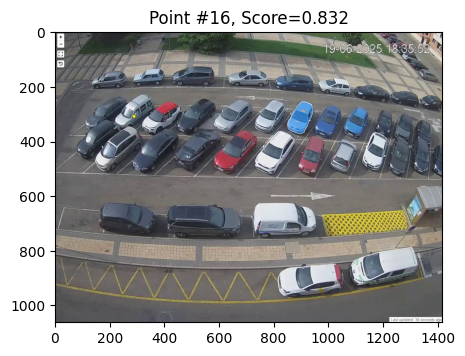

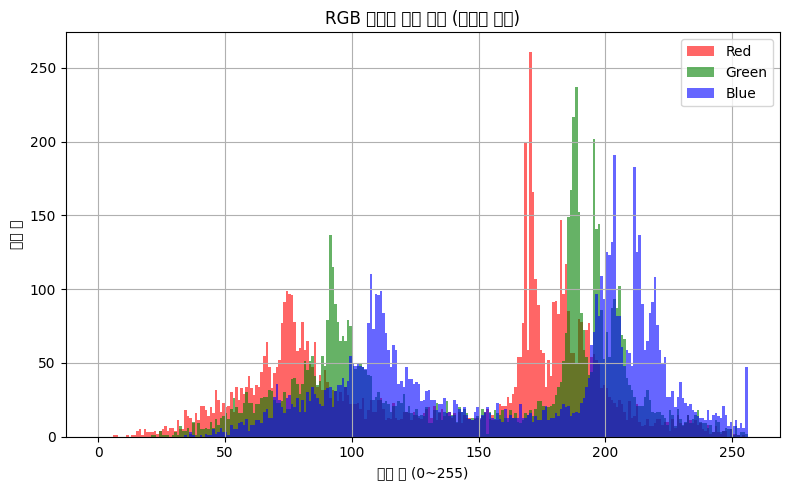

첫 번째 마스크의 픽셀 개수: 7895
첫 번째 마스크의 픽셀 개수: 7895.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(65), np.uint8(106), np.uint8(170)) → 102 픽셀
색상 (np.uint8(65), np.uint8(105), np.uint8(174)) → 98 픽셀
색상 (np.uint8(65), np.uint8(106), np.uint8(168)) → 68 픽셀
색상 (np.uint8(64), np.uint8(105), np.uint8(167)) → 47 픽셀
색상 (np.uint8(64), np.uint8(105), np.uint8(169)) → 47 픽셀
색상 (np.uint8(65), np.uint8(106), np.uint8(172)) → 43 픽셀
색상 (np.uint8(65), np.uint8(105), np.uint8(175)) → 31 픽셀
색상 (np.uint8(66), np.uint8(109), np.uint8(177)) → 28 픽셀
색상 (np.uint8(74), np.uint8(89), np.uint8(110)) → 25 픽셀
색상 (np.uint8(64), np.uint8(104), np.uint8(174)) → 25 픽셀
idx: 17, [O] Occupied Count: 17, Empty Count: 0, slot=B8, Score=0.957, width=99, height=121
idx: 17, [O] Occupied Count: 17, Empty Count: 0, 색상수=5042, 채도편차=34.06, 비율=0.82


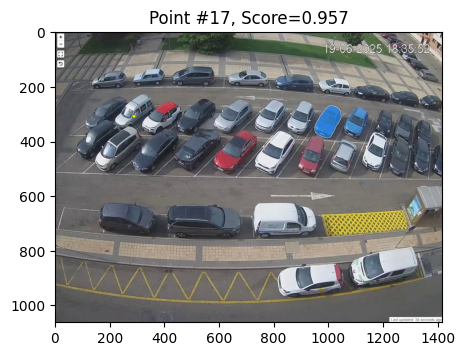

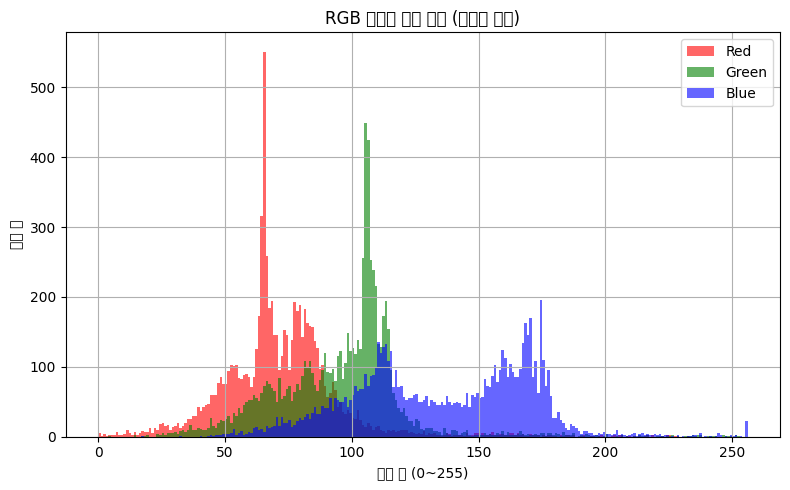

첫 번째 마스크의 픽셀 개수: 12694
첫 번째 마스크의 픽셀 개수: 12694.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(65), np.uint8(106), np.uint8(170)) → 102 픽셀
색상 (np.uint8(65), np.uint8(105), np.uint8(174)) → 98 픽셀
색상 (np.uint8(65), np.uint8(106), np.uint8(168)) → 68 픽셀
색상 (np.uint8(64), np.uint8(105), np.uint8(167)) → 47 픽셀
색상 (np.uint8(64), np.uint8(105), np.uint8(169)) → 47 픽셀
색상 (np.uint8(65), np.uint8(106), np.uint8(172)) → 43 픽셀
색상 (np.uint8(65), np.uint8(105), np.uint8(175)) → 31 픽셀
색상 (np.uint8(66), np.uint8(109), np.uint8(177)) → 28 픽셀
색상 (np.uint8(74), np.uint8(89), np.uint8(110)) → 25 픽셀
색상 (np.uint8(64), np.uint8(104), np.uint8(174)) → 25 픽셀
idx: 18, [O] Occupied Count: 18, Empty Count: 0


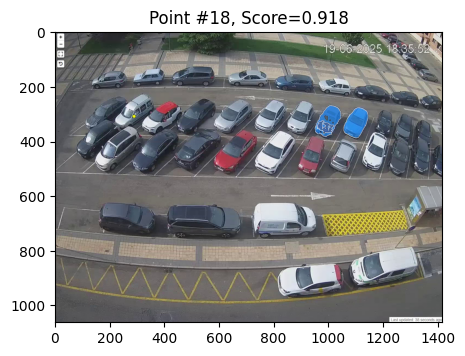

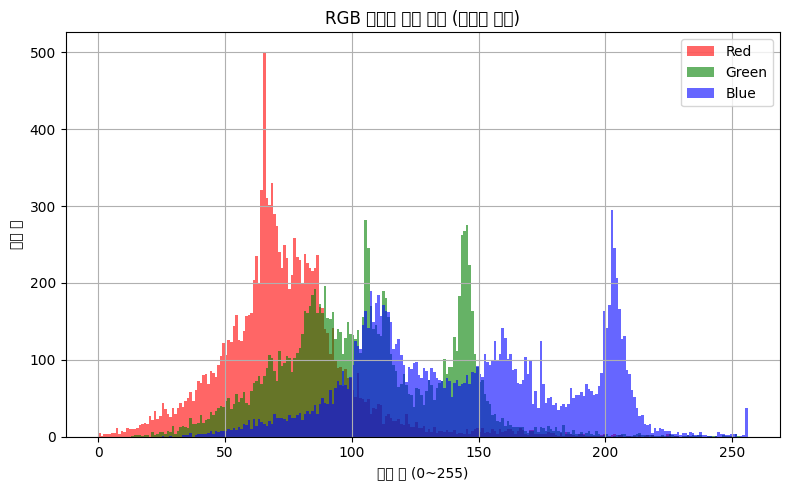

첫 번째 마스크의 픽셀 개수: 4460
첫 번째 마스크의 픽셀 개수: 4460.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(57), np.uint8(65), np.uint8(84)) → 30 픽셀
색상 (np.uint8(72), np.uint8(88), np.uint8(104)) → 23 픽셀
색상 (np.uint8(57), np.uint8(66), np.uint8(83)) → 22 픽셀
색상 (np.uint8(73), np.uint8(89), np.uint8(105)) → 21 픽셀
색상 (np.uint8(71), np.uint8(87), np.uint8(103)) → 21 픽셀
색상 (np.uint8(58), np.uint8(66), np.uint8(85)) → 19 픽셀
색상 (np.uint8(60), np.uint8(72), np.uint8(84)) → 17 픽셀
색상 (np.uint8(57), np.uint8(69), np.uint8(81)) → 17 픽셀
색상 (np.uint8(61), np.uint8(73), np.uint8(85)) → 15 픽셀
색상 (np.uint8(90), np.uint8(99), np.uint8(108)) → 14 픽셀
idx: 19, [O] Occupied Count: 19, Empty Count: 0, slot=B10, Score=0.930, width=63, height=96
idx: 19, [O] Occupied Count: 19, Empty Count: 0, 색상수=2083, 채도편차=23.87, 비율=0.66


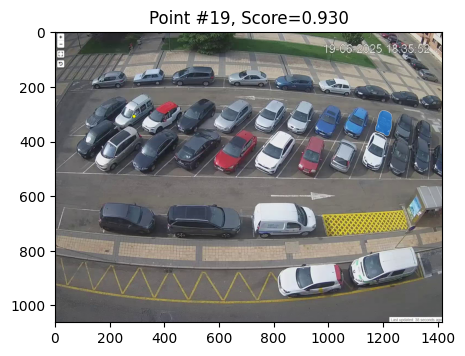

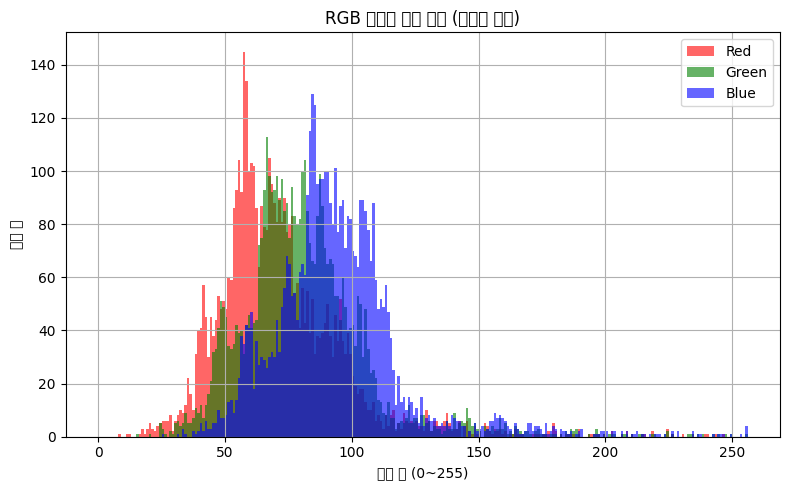

첫 번째 마스크의 픽셀 개수: 5259
첫 번째 마스크의 픽셀 개수: 5259.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(96), np.uint8(112), np.uint8(127)) → 38 픽셀
색상 (np.uint8(62), np.uint8(75), np.uint8(91)) → 35 픽셀
색상 (np.uint8(98), np.uint8(114), np.uint8(129)) → 32 픽셀
색상 (np.uint8(100), np.uint8(113), np.uint8(129)) → 28 픽셀
색상 (np.uint8(100), np.uint8(116), np.uint8(131)) → 27 픽셀
색상 (np.uint8(97), np.uint8(113), np.uint8(128)) → 27 픽셀
색상 (np.uint8(99), np.uint8(112), np.uint8(128)) → 26 픽셀
색상 (np.uint8(100), np.uint8(116), np.uint8(132)) → 24 픽셀
색상 (np.uint8(97), np.uint8(113), np.uint8(129)) → 23 픽셀
색상 (np.uint8(99), np.uint8(115), np.uint8(130)) → 23 픽셀
idx: 20, [O] Occupied Count: 20, Empty Count: 0, slot=B11, Score=0.895, width=72, height=102
idx: 20, [O] Occupied Count: 20, Empty Count: 0, 색상수=2269, 채도편차=21.63, 비율=0.71


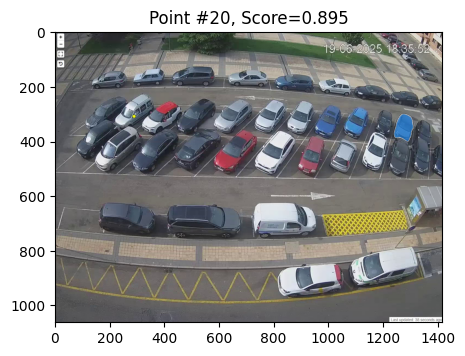

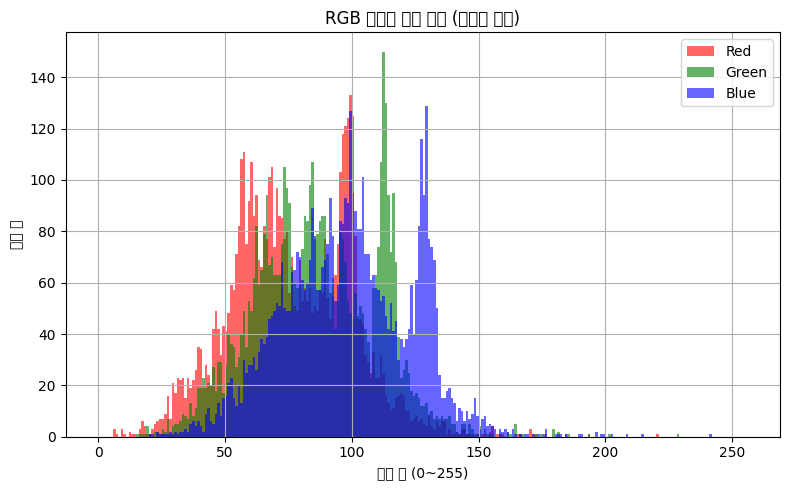

첫 번째 마스크의 픽셀 개수: 3938
첫 번째 마스크의 픽셀 개수: 3938.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(63), np.uint8(76), np.uint8(92)) → 83 픽셀
색상 (np.uint8(62), np.uint8(75), np.uint8(91)) → 72 픽셀
색상 (np.uint8(61), np.uint8(74), np.uint8(90)) → 60 픽셀
색상 (np.uint8(64), np.uint8(77), np.uint8(93)) → 56 픽셀
색상 (np.uint8(60), np.uint8(73), np.uint8(89)) → 51 픽셀
색상 (np.uint8(67), np.uint8(80), np.uint8(96)) → 51 픽셀
색상 (np.uint8(66), np.uint8(79), np.uint8(95)) → 46 픽셀
색상 (np.uint8(65), np.uint8(78), np.uint8(94)) → 32 픽셀
색상 (np.uint8(68), np.uint8(81), np.uint8(97)) → 30 픽셀
색상 (np.uint8(70), np.uint8(83), np.uint8(99)) → 28 픽셀
idx: 21, [O] Occupied Count: 21, Empty Count: 0, slot=B12, Score=0.914, width=59, height=99
idx: 21, [O] Occupied Count: 21, Empty Count: 0, 색상수=1791, 채도편차=22.79, 비율=0.60


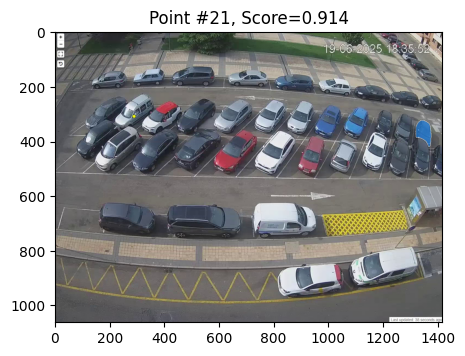

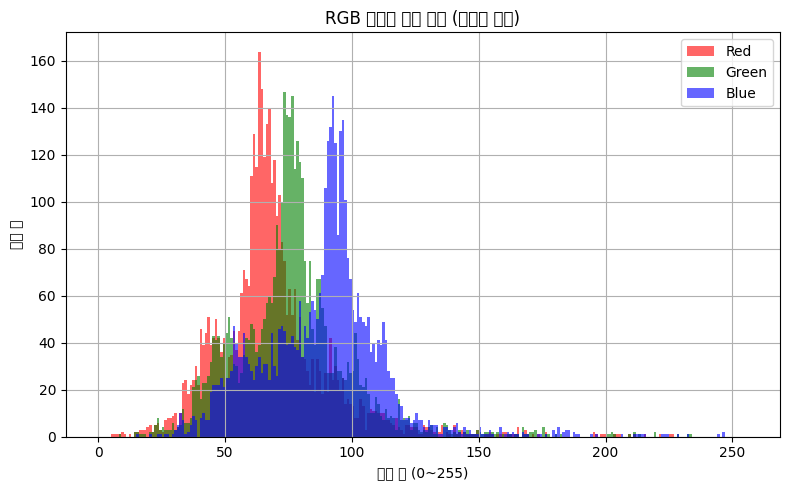

첫 번째 마스크의 픽셀 개수: 11733
첫 번째 마스크의 픽셀 개수: 11733.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(81), np.uint8(94), np.uint8(111)) → 75 픽셀
색상 (np.uint8(31), np.uint8(35), np.uint8(46)) → 73 픽셀
색상 (np.uint8(72), np.uint8(81), np.uint8(98)) → 66 픽셀
색상 (np.uint8(82), np.uint8(95), np.uint8(112)) → 59 픽셀
색상 (np.uint8(29), np.uint8(33), np.uint8(44)) → 59 픽셀
색상 (np.uint8(28), np.uint8(32), np.uint8(43)) → 59 픽셀
색상 (np.uint8(79), np.uint8(92), np.uint8(109)) → 57 픽셀
색상 (np.uint8(33), np.uint8(36), np.uint8(45)) → 57 픽셀
색상 (np.uint8(33), np.uint8(37), np.uint8(48)) → 56 픽셀
색상 (np.uint8(68), np.uint8(81), np.uint8(98)) → 53 픽셀
idx: 22, [O] Occupied Count: 22, Empty Count: 0, slot=C1, Score=0.953, width=158, height=142
idx: 22, [O] Occupied Count: 22, Empty Count: 0, 색상수=3754, 채도편차=24.25, 비율=1.11


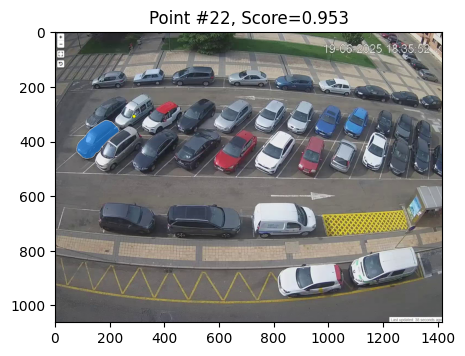

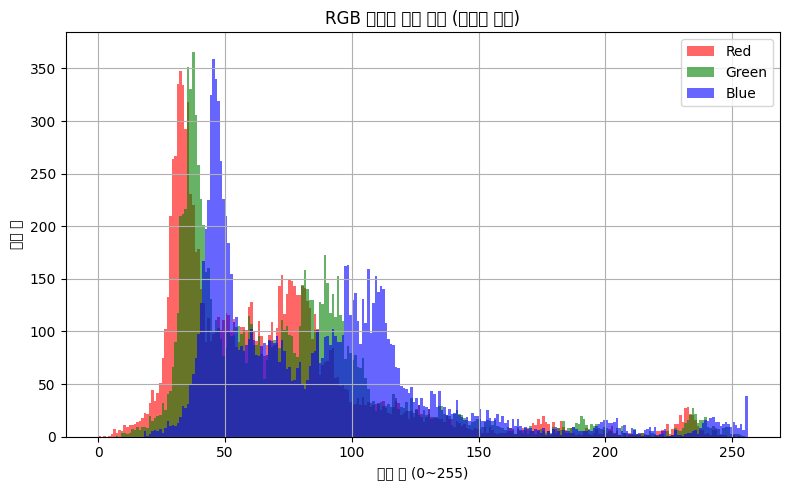

첫 번째 마스크의 픽셀 개수: 15733
첫 번째 마스크의 픽셀 개수: 15733.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(235), np.uint8(235), np.uint8(237)) → 171 픽셀
색상 (np.uint8(236), np.uint8(236), np.uint8(238)) → 142 픽셀
색상 (np.uint8(165), np.uint8(169), np.uint8(178)) → 47 픽셀
색상 (np.uint8(57), np.uint8(60), np.uint8(69)) → 47 픽셀
색상 (np.uint8(55), np.uint8(58), np.uint8(67)) → 41 픽셀
색상 (np.uint8(234), np.uint8(234), np.uint8(236)) → 41 픽셀
색상 (np.uint8(67), np.uint8(77), np.uint8(89)) → 40 픽셀
색상 (np.uint8(56), np.uint8(59), np.uint8(68)) → 39 픽셀
색상 (np.uint8(73), np.uint8(83), np.uint8(95)) → 37 픽셀
색상 (np.uint8(58), np.uint8(61), np.uint8(70)) → 37 픽셀
idx: 23, [O] Occupied Count: 23, Empty Count: 0, slot=C2, Score=0.961, width=174, height=165
idx: 23, [O] Occupied Count: 23, Empty Count: 0, 색상수=6077, 채도편차=26.70, 비율=1.05


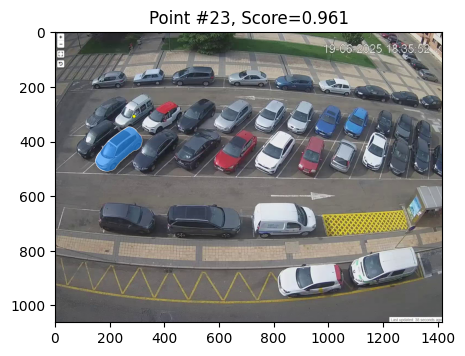

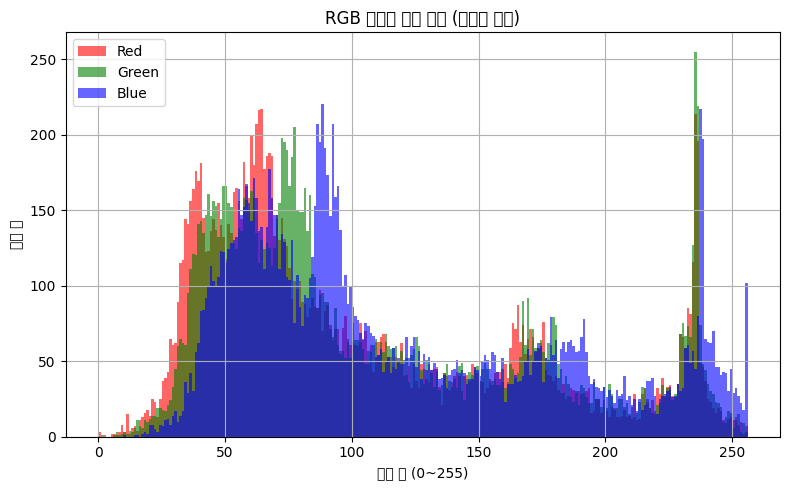

첫 번째 마스크의 픽셀 개수: 14528
첫 번째 마스크의 픽셀 개수: 14528.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(63), np.uint8(75), np.uint8(97)) → 148 픽셀
색상 (np.uint8(63), np.uint8(75), np.uint8(99)) → 127 픽셀
색상 (np.uint8(63), np.uint8(71), np.uint8(94)) → 100 픽셀
색상 (np.uint8(63), np.uint8(74), np.uint8(94)) → 76 픽셀
색상 (np.uint8(61), np.uint8(72), np.uint8(92)) → 74 픽셀
색상 (np.uint8(62), np.uint8(75), np.uint8(94)) → 70 픽셀
색상 (np.uint8(64), np.uint8(72), np.uint8(95)) → 70 픽셀
색상 (np.uint8(60), np.uint8(68), np.uint8(91)) → 68 픽셀
색상 (np.uint8(26), np.uint8(29), np.uint8(38)) → 61 픽셀
색상 (np.uint8(68), np.uint8(81), np.uint8(100)) → 60 픽셀
idx: 24, [O] Occupied Count: 24, Empty Count: 0, slot=C3, Score=0.953, width=169, height=160
idx: 24, [O] Occupied Count: 24, Empty Count: 0, 색상수=4850, 채도편차=24.16, 비율=1.06


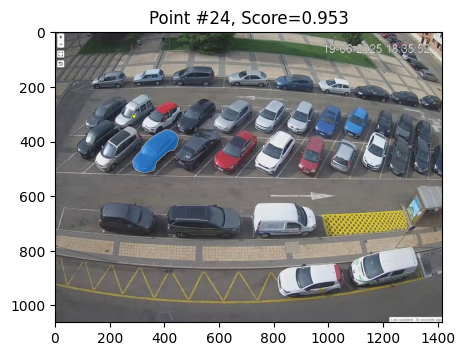

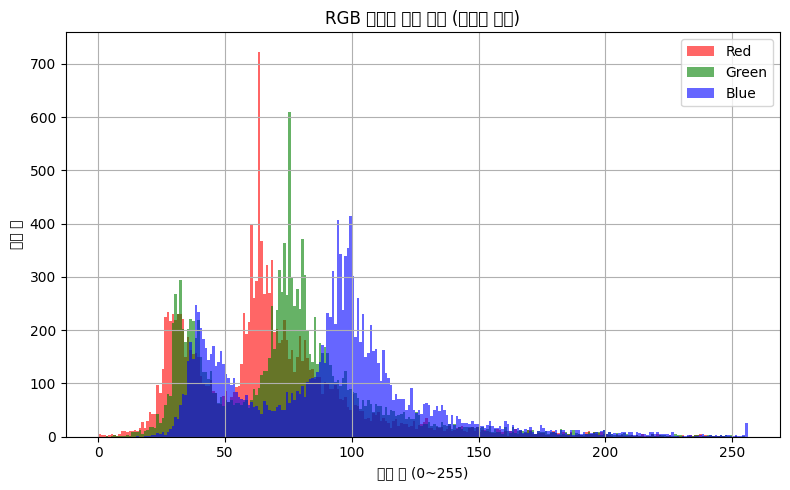

첫 번째 마스크의 픽셀 개수: 14874
첫 번째 마스크의 픽셀 개수: 14874.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(86), np.uint8(101), np.uint8(122)) → 193 픽셀
색상 (np.uint8(82), np.uint8(97), np.uint8(118)) → 167 픽셀
색상 (np.uint8(84), np.uint8(96), np.uint8(118)) → 144 픽셀
색상 (np.uint8(40), np.uint8(38), np.uint8(49)) → 111 픽셀
색상 (np.uint8(83), np.uint8(98), np.uint8(119)) → 87 픽셀
색상 (np.uint8(37), np.uint8(38), np.uint8(43)) → 85 픽셀
색상 (np.uint8(39), np.uint8(38), np.uint8(43)) → 79 픽셀
색상 (np.uint8(87), np.uint8(102), np.uint8(123)) → 75 픽셀
색상 (np.uint8(41), np.uint8(39), np.uint8(50)) → 70 픽셀
색상 (np.uint8(89), np.uint8(101), np.uint8(123)) → 57 픽셀
idx: 25, [O] Occupied Count: 25, Empty Count: 0, slot=C4, Score=0.938, width=171, height=150
idx: 25, [O] Occupied Count: 25, Empty Count: 0, 색상수=4756, 채도편차=21.48, 비율=1.14


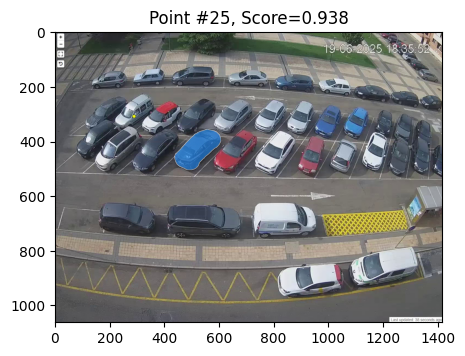

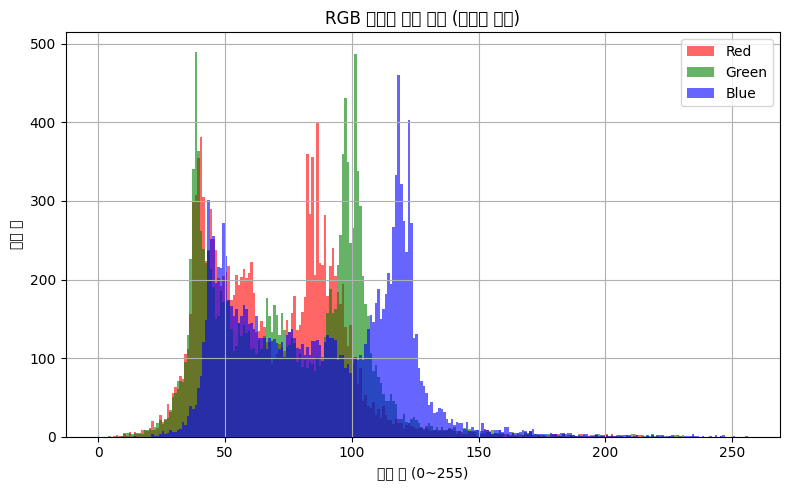

첫 번째 마스크의 픽셀 개수: 14295
첫 번째 마스크의 픽셀 개수: 14295.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(61), np.uint8(68), np.uint8(86)) → 153 픽셀
색상 (np.uint8(60), np.uint8(67), np.uint8(86)) → 120 픽셀
색상 (np.uint8(172), np.uint8(60), np.uint8(76)) → 95 픽셀
색상 (np.uint8(176), np.uint8(58), np.uint8(72)) → 71 픽셀
색상 (np.uint8(62), np.uint8(69), np.uint8(87)) → 70 픽셀
색상 (np.uint8(176), np.uint8(60), np.uint8(73)) → 65 픽셀
색상 (np.uint8(170), np.uint8(59), np.uint8(75)) → 60 픽셀
색상 (np.uint8(171), np.uint8(58), np.uint8(76)) → 57 픽셀
색상 (np.uint8(174), np.uint8(59), np.uint8(76)) → 56 픽셀
색상 (np.uint8(176), np.uint8(59), np.uint8(77)) → 55 픽셀
idx: 26, [O] Occupied Count: 26, Empty Count: 0, slot=C5, Score=0.961, width=158, height=156
idx: 26, [O] Occupied Count: 26, Empty Count: 0, 색상수=8554, 채도편차=48.75, 비율=1.01


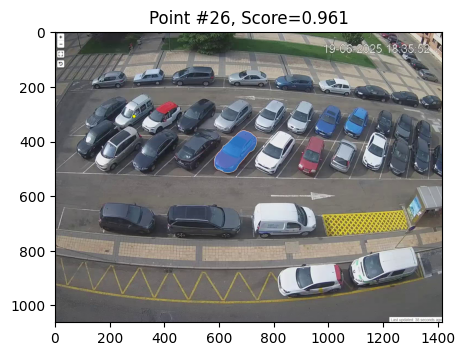

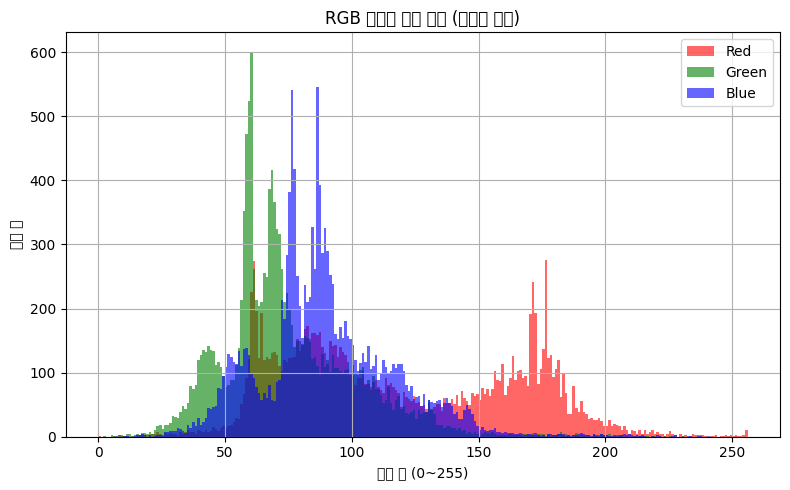

첫 번째 마스크의 픽셀 개수: 14109
첫 번째 마스크의 픽셀 개수: 14109.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(227), np.uint8(230), np.uint8(235)) → 294 픽셀
색상 (np.uint8(234), np.uint8(234), np.uint8(236)) → 267 픽셀
색상 (np.uint8(234), np.uint8(234), np.uint8(234)) → 184 픽셀
색상 (np.uint8(228), np.uint8(231), np.uint8(236)) → 180 픽셀
색상 (np.uint8(232), np.uint8(231), np.uint8(236)) → 177 픽셀
색상 (np.uint8(232), np.uint8(232), np.uint8(234)) → 158 픽셀
색상 (np.uint8(230), np.uint8(233), np.uint8(238)) → 143 픽셀
색상 (np.uint8(232), np.uint8(233), np.uint8(237)) → 140 픽셀
색상 (np.uint8(234), np.uint8(233), np.uint8(238)) → 133 픽셀
색상 (np.uint8(230), np.uint8(231), np.uint8(235)) → 132 픽셀
idx: 27, [O] Occupied Count: 27, Empty Count: 0, slot=C6, Score=0.957, width=149, height=159
idx: 27, [O] Occupied Count: 27, Empty Count: 0, 색상수=5610, 채도편차=27.60, 비율=0.94


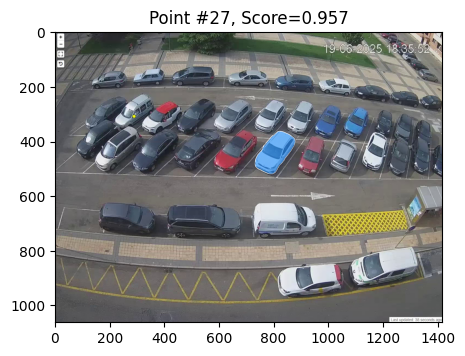

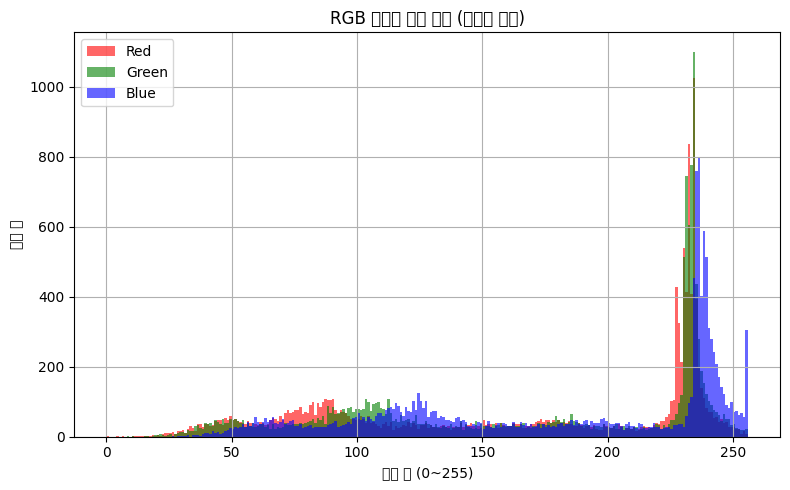

첫 번째 마스크의 픽셀 개수: 8951
첫 번째 마스크의 픽셀 개수: 8951.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(157), np.uint8(96), np.uint8(114)) → 104 픽셀
색상 (np.uint8(159), np.uint8(96), np.uint8(113)) → 86 픽셀
색상 (np.uint8(158), np.uint8(97), np.uint8(115)) → 85 픽셀
색상 (np.uint8(156), np.uint8(98), np.uint8(113)) → 85 픽셀
색상 (np.uint8(158), np.uint8(95), np.uint8(114)) → 74 픽셀
색상 (np.uint8(156), np.uint8(99), np.uint8(118)) → 59 픽셀
색상 (np.uint8(155), np.uint8(96), np.uint8(114)) → 51 픽셀
색상 (np.uint8(153), np.uint8(99), np.uint8(115)) → 50 픽셀
색상 (np.uint8(166), np.uint8(81), np.uint8(100)) → 45 픽셀
색상 (np.uint8(155), np.uint8(98), np.uint8(115)) → 42 픽셀
idx: 28, [O] Occupied Count: 28, Empty Count: 0, slot=C7, Score=0.957, width=97, height=144
idx: 28, [O] Occupied Count: 28, Empty Count: 0, 색상수=5431, 채도편차=31.49, 비율=0.67


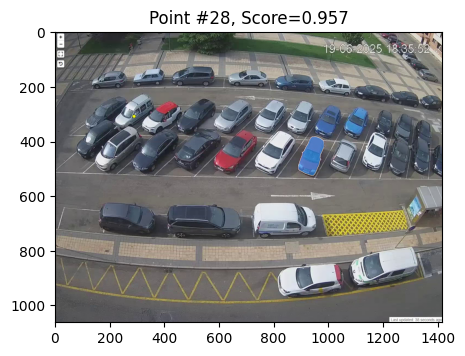

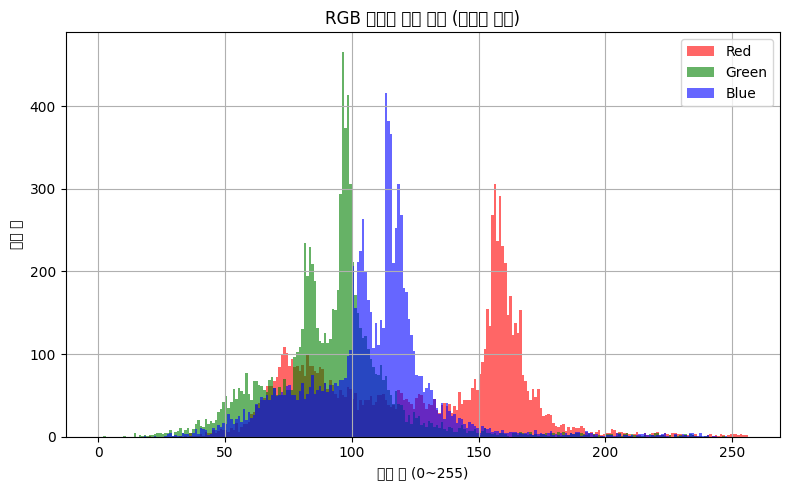

첫 번째 마스크의 픽셀 개수: 7839
첫 번째 마스크의 픽셀 개수: 7839.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(176), np.uint8(189), np.uint8(205)) → 313 픽셀
색상 (np.uint8(174), np.uint8(187), np.uint8(203)) → 207 픽셀
색상 (np.uint8(175), np.uint8(188), np.uint8(204)) → 162 픽셀
색상 (np.uint8(173), np.uint8(186), np.uint8(202)) → 155 픽셀
색상 (np.uint8(171), np.uint8(184), np.uint8(200)) → 96 픽셀
색상 (np.uint8(178), np.uint8(191), np.uint8(207)) → 77 픽셀
색상 (np.uint8(177), np.uint8(190), np.uint8(206)) → 74 픽셀
색상 (np.uint8(170), np.uint8(183), np.uint8(199)) → 58 픽셀
색상 (np.uint8(172), np.uint8(185), np.uint8(201)) → 50 픽셀
색상 (np.uint8(170), np.uint8(183), np.uint8(200)) → 49 픽셀
idx: 29, [O] Occupied Count: 29, Empty Count: 0, slot=C8, Score=0.957, width=99, height=123
idx: 29, [O] Occupied Count: 29, Empty Count: 0, 색상수=3925, 채도편차=20.42, 비율=0.80


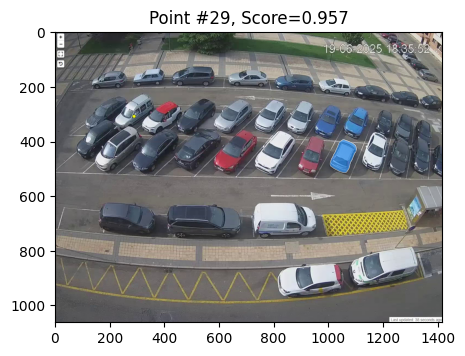

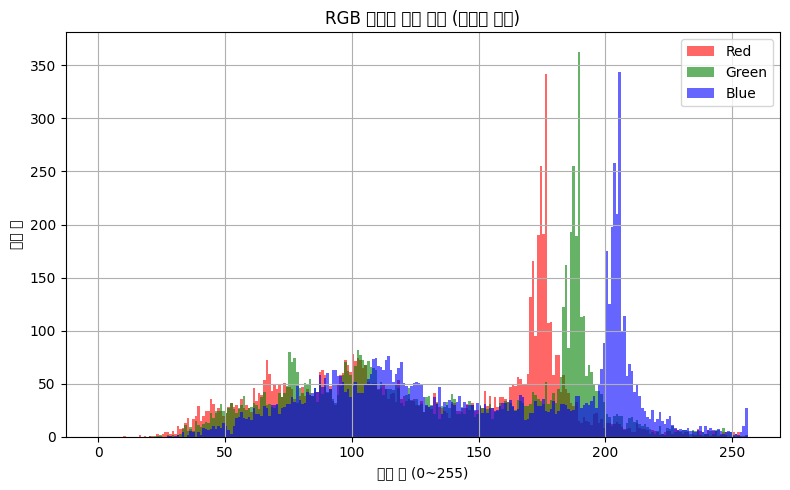

첫 번째 마스크의 픽셀 개수: 9406
첫 번째 마스크의 픽셀 개수: 9406.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(217), np.uint8(226), np.uint8(233)) → 206 픽셀
색상 (np.uint8(216), np.uint8(225), np.uint8(232)) → 164 픽셀
색상 (np.uint8(219), np.uint8(229), np.uint8(238)) → 140 픽셀
색상 (np.uint8(217), np.uint8(226), np.uint8(235)) → 108 픽셀
색상 (np.uint8(220), np.uint8(229), np.uint8(236)) → 73 픽셀
색상 (np.uint8(218), np.uint8(227), np.uint8(234)) → 71 픽셀
색상 (np.uint8(216), np.uint8(225), np.uint8(234)) → 62 픽셀
색상 (np.uint8(219), np.uint8(229), np.uint8(241)) → 47 픽셀
색상 (np.uint8(218), np.uint8(227), np.uint8(236)) → 44 픽셀
색상 (np.uint8(220), np.uint8(229), np.uint8(234)) → 43 픽셀
idx: 30, [O] Occupied Count: 30, Empty Count: 0, slot=C9, Score=0.957, width=94, height=143
idx: 30, [O] Occupied Count: 30, Empty Count: 0, 색상수=4372, 채도편차=29.57, 비율=0.66


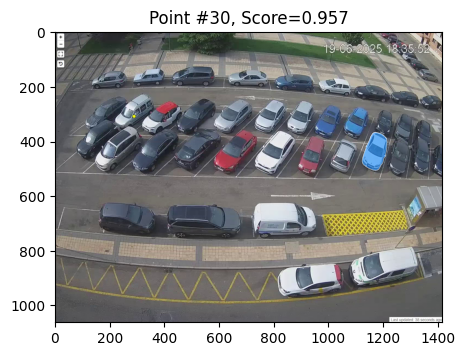

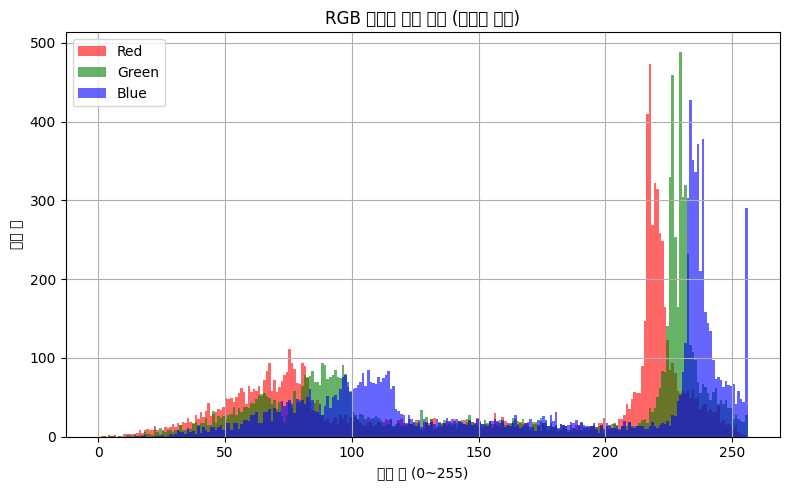

첫 번째 마스크의 픽셀 개수: 7920
첫 번째 마스크의 픽셀 개수: 7920.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(75), np.uint8(83), np.uint8(96)) → 437 픽셀
색상 (np.uint8(78), np.uint8(86), np.uint8(99)) → 173 픽셀
색상 (np.uint8(76), np.uint8(84), np.uint8(97)) → 98 픽셀
색상 (np.uint8(76), np.uint8(82), np.uint8(94)) → 95 픽셀
색상 (np.uint8(74), np.uint8(82), np.uint8(95)) → 92 픽셀
색상 (np.uint8(73), np.uint8(81), np.uint8(94)) → 89 픽셀
색상 (np.uint8(77), np.uint8(85), np.uint8(98)) → 65 픽셀
색상 (np.uint8(72), np.uint8(80), np.uint8(93)) → 57 픽셀
색상 (np.uint8(73), np.uint8(83), np.uint8(93)) → 56 픽셀
색상 (np.uint8(82), np.uint8(92), np.uint8(104)) → 53 픽셀
idx: 31, [O] Occupied Count: 31, Empty Count: 0, slot=C10, Score=0.914, width=78, height=140
idx: 31, [O] Occupied Count: 31, Empty Count: 0, 색상수=2055, 채도편차=13.90, 비율=0.56


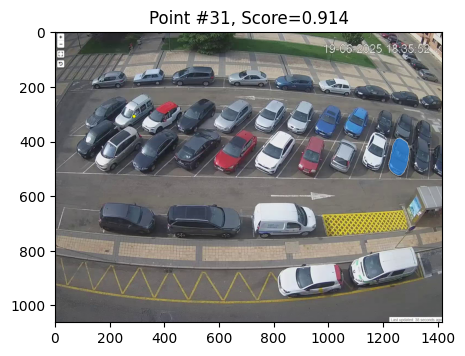

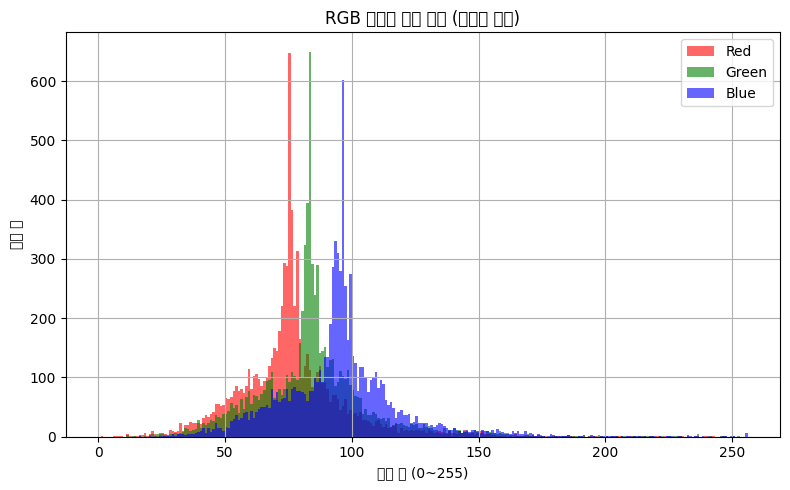

첫 번째 마스크의 픽셀 개수: 7083
첫 번째 마스크의 픽셀 개수: 7083.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(67), np.uint8(80), np.uint8(97)) → 90 픽셀
색상 (np.uint8(69), np.uint8(82), np.uint8(99)) → 72 픽셀
색상 (np.uint8(68), np.uint8(81), np.uint8(98)) → 61 픽셀
색상 (np.uint8(65), np.uint8(81), np.uint8(96)) → 52 픽셀
색상 (np.uint8(70), np.uint8(87), np.uint8(103)) → 48 픽셀
색상 (np.uint8(88), np.uint8(96), np.uint8(115)) → 43 픽셀
색상 (np.uint8(66), np.uint8(79), np.uint8(96)) → 42 픽셀
색상 (np.uint8(78), np.uint8(91), np.uint8(108)) → 40 픽셀
색상 (np.uint8(89), np.uint8(97), np.uint8(116)) → 37 픽셀
색상 (np.uint8(42), np.uint8(46), np.uint8(57)) → 36 픽셀
idx: 32, [O] Occupied Count: 32, Empty Count: 0, slot=C11, Score=0.934, width=67, height=130
idx: 32, [O] Occupied Count: 32, Empty Count: 0, 색상수=2467, 채도편차=20.21, 비율=0.52


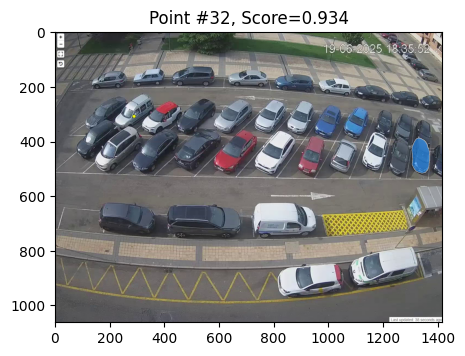

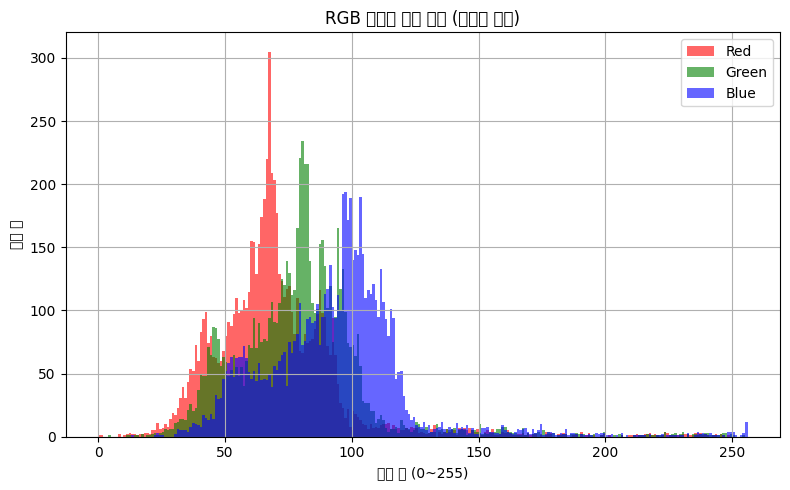

첫 번째 마스크의 픽셀 개수: 3784
첫 번째 마스크의 픽셀 개수: 3784.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(44), np.uint8(46), np.uint8(58)) → 39 픽셀
색상 (np.uint8(55), np.uint8(71), np.uint8(87)) → 32 픽셀
색상 (np.uint8(39), np.uint8(48), np.uint8(57)) → 28 픽셀
색상 (np.uint8(56), np.uint8(63), np.uint8(92)) → 26 픽셀
색상 (np.uint8(40), np.uint8(49), np.uint8(58)) → 21 픽셀
색상 (np.uint8(43), np.uint8(52), np.uint8(61)) → 20 픽셀
색상 (np.uint8(38), np.uint8(47), np.uint8(56)) → 19 픽셀
색상 (np.uint8(57), np.uint8(68), np.uint8(96)) → 17 픽셀
색상 (np.uint8(58), np.uint8(63), np.uint8(93)) → 17 픽셀
색상 (np.uint8(41), np.uint8(50), np.uint8(59)) → 16 픽셀
idx: 33, [O] Occupied Count: 33, Empty Count: 0, slot=C12, Score=0.879, width=40, height=119
idx: 33, [O] Occupied Count: 33, Empty Count: 0, 색상수=1958, 채도편차=26.28, 비율=0.34


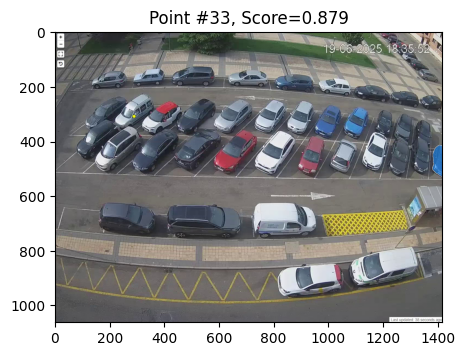

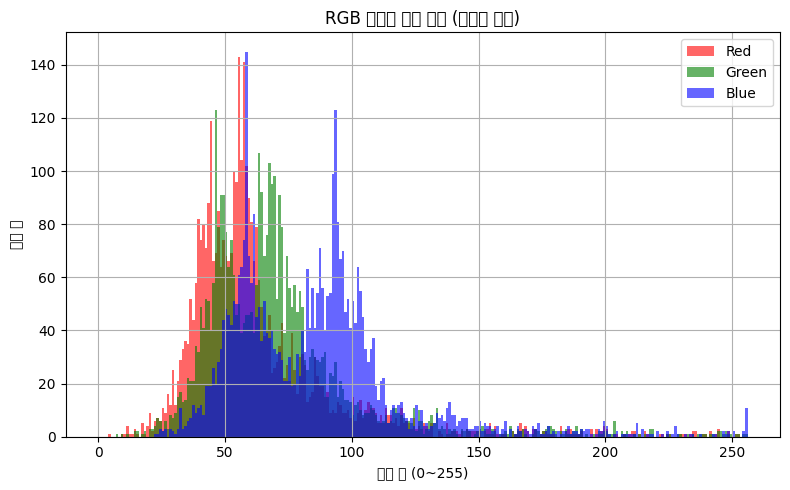

첫 번째 마스크의 픽셀 개수: 11970
첫 번째 마스크의 픽셀 개수: 11970.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(105), np.uint8(103), np.uint8(104)) → 642 픽셀
색상 (np.uint8(104), np.uint8(102), np.uint8(103)) → 473 픽셀
색상 (np.uint8(106), np.uint8(104), np.uint8(105)) → 367 픽셀
색상 (np.uint8(108), np.uint8(106), np.uint8(107)) → 300 픽셀
색상 (np.uint8(102), np.uint8(100), np.uint8(101)) → 300 픽셀
색상 (np.uint8(109), np.uint8(107), np.uint8(108)) → 287 픽셀
색상 (np.uint8(101), np.uint8(99), np.uint8(100)) → 285 픽셀
색상 (np.uint8(105), np.uint8(104), np.uint8(102)) → 284 픽셀
색상 (np.uint8(103), np.uint8(102), np.uint8(100)) → 271 픽셀
색상 (np.uint8(103), np.uint8(101), np.uint8(102)) → 266 픽셀
idx: 34, [X] Occupied Count: 33, Empty Count: 1, slot=D1, Score=0.918, width=388, height=93, 색상수=619, 채도편차=5.42, 비율=4.17


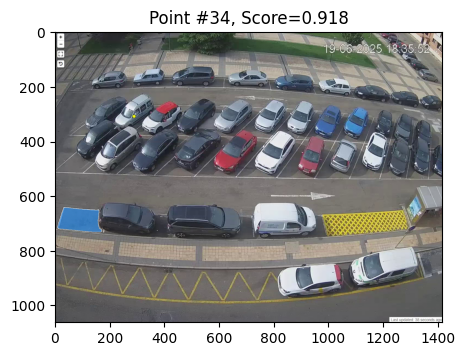

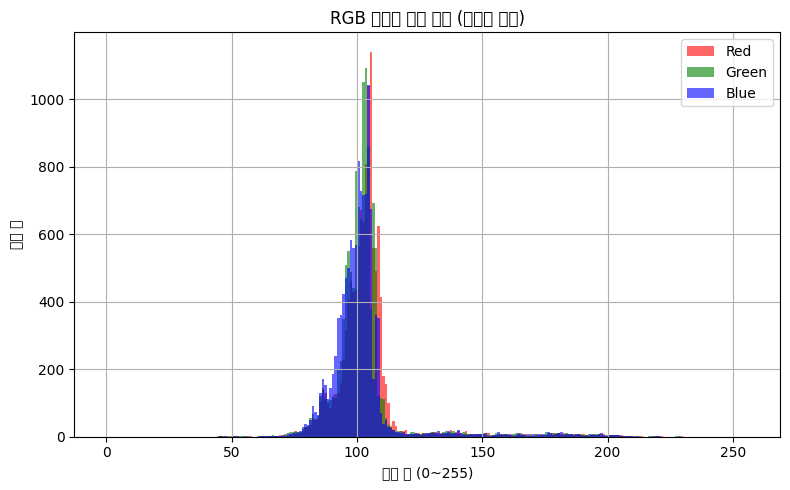

첫 번째 마스크의 픽셀 개수: 19769
첫 번째 마스크의 픽셀 개수: 19769.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(77), np.uint8(84), np.uint8(100)) → 414 픽셀
색상 (np.uint8(78), np.uint8(85), np.uint8(103)) → 223 픽셀
색상 (np.uint8(78), np.uint8(85), np.uint8(101)) → 220 픽셀
색상 (np.uint8(53), np.uint8(52), np.uint8(57)) → 181 픽셀
색상 (np.uint8(46), np.uint8(45), np.uint8(50)) → 180 픽셀
색상 (np.uint8(51), np.uint8(50), np.uint8(55)) → 173 픽셀
색상 (np.uint8(79), np.uint8(87), np.uint8(106)) → 169 픽셀
색상 (np.uint8(79), np.uint8(86), np.uint8(104)) → 169 픽셀
색상 (np.uint8(78), np.uint8(86), np.uint8(105)) → 168 픽셀
색상 (np.uint8(49), np.uint8(50), np.uint8(55)) → 159 픽셀
idx: 35, [O] Occupied Count: 34, Empty Count: 1, slot=D2, Score=0.953, width=206, height=115
idx: 35, [O] Occupied Count: 34, Empty Count: 1, 색상수=4097, 채도편차=23.06, 비율=1.79


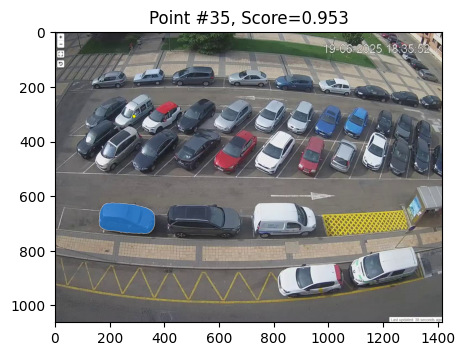

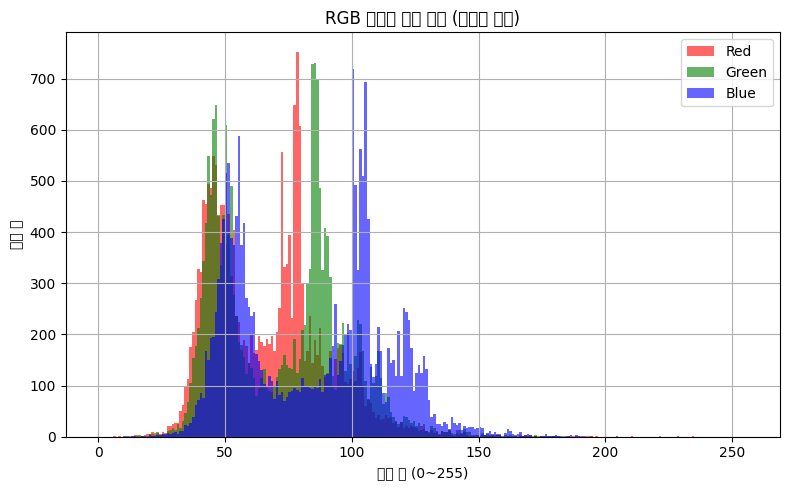

첫 번째 마스크의 픽셀 개수: 28597
첫 번째 마스크의 픽셀 개수: 28597.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(54), np.uint8(61), np.uint8(77)) → 711 픽셀
색상 (np.uint8(96), np.uint8(105), np.uint8(122)) → 414 픽셀
색상 (np.uint8(96), np.uint8(108), np.uint8(120)) → 293 픽셀
색상 (np.uint8(60), np.uint8(68), np.uint8(87)) → 282 픽셀
색상 (np.uint8(59), np.uint8(66), np.uint8(84)) → 242 픽셀
색상 (np.uint8(53), np.uint8(60), np.uint8(76)) → 236 픽셀
색상 (np.uint8(56), np.uint8(63), np.uint8(79)) → 233 픽셀
색상 (np.uint8(57), np.uint8(64), np.uint8(82)) → 198 픽셀
색상 (np.uint8(57), np.uint8(64), np.uint8(80)) → 195 픽셀
색상 (np.uint8(95), np.uint8(108), np.uint8(124)) → 191 픽셀
idx: 36, [O] Occupied Count: 35, Empty Count: 1, slot=D3, Score=0.980, width=273, height=121
idx: 36, [O] Occupied Count: 35, Empty Count: 1, 색상수=5178, 채도편차=27.97, 비율=2.26


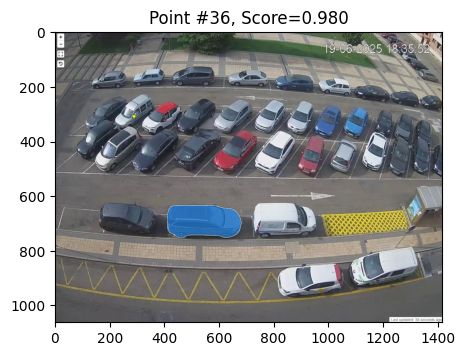

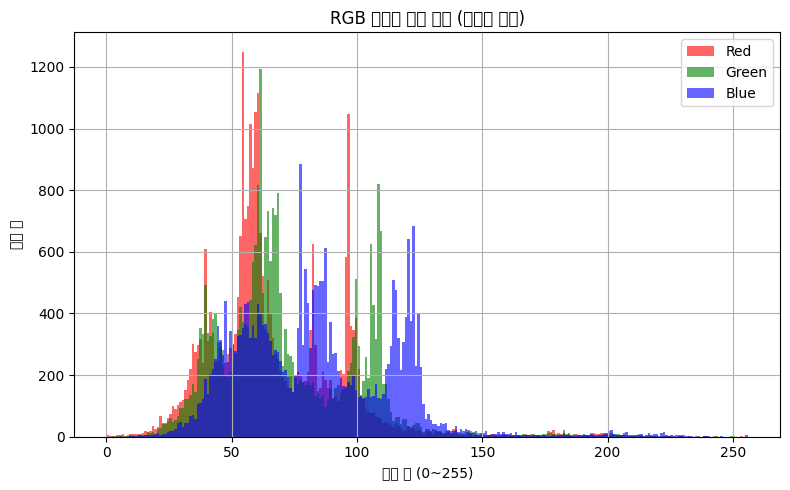

첫 번째 마스크의 픽셀 개수: 25206
첫 번째 마스크의 픽셀 개수: 25206.0
🎨 마스크 내 상위 색상 분포:
색상 (np.uint8(225), np.uint8(230), np.uint8(234)) → 1295 픽셀
색상 (np.uint8(224), np.uint8(229), np.uint8(233)) → 544 픽셀
색상 (np.uint8(220), np.uint8(227), np.uint8(233)) → 318 픽셀
색상 (np.uint8(221), np.uint8(228), np.uint8(234)) → 277 픽셀
색상 (np.uint8(217), np.uint8(226), np.uint8(235)) → 273 픽셀
색상 (np.uint8(221), np.uint8(231), np.uint8(233)) → 225 픽셀
색상 (np.uint8(219), np.uint8(228), np.uint8(235)) → 182 픽셀
색상 (np.uint8(220), np.uint8(229), np.uint8(236)) → 146 픽셀
색상 (np.uint8(227), np.uint8(230), np.uint8(237)) → 143 픽셀
색상 (np.uint8(218), np.uint8(227), np.uint8(236)) → 127 픽셀
idx: 37, [O] Occupied Count: 36, Empty Count: 1, slot=D4, Score=0.977, width=234, height=129
idx: 37, [O] Occupied Count: 36, Empty Count: 1, 색상수=6837, 채도편차=23.76, 비율=1.81


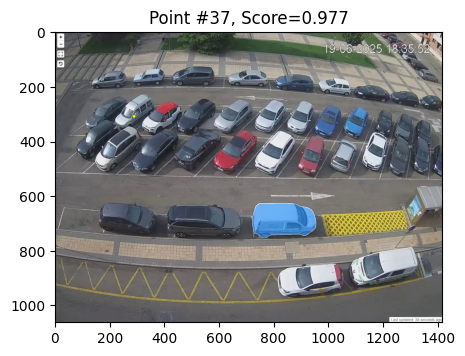

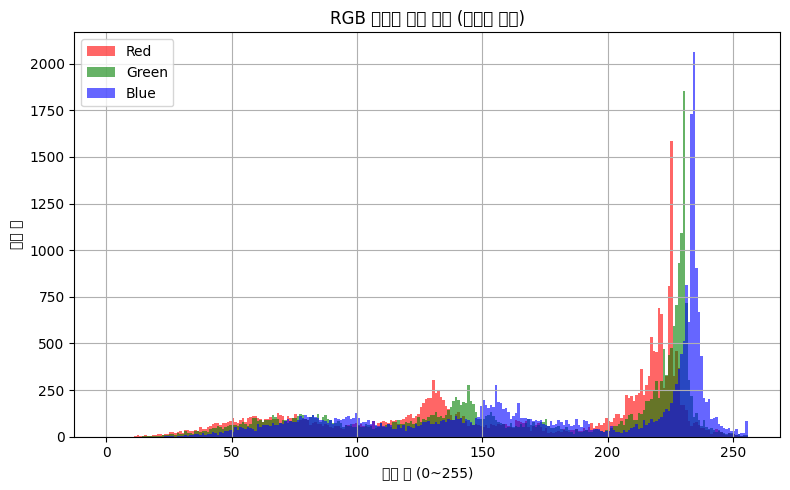

Occupied Count:  36
Empty Count   :  1


In [67]:

occupiedCount = 0 
emptyCount = 0

#                   1      2      3      4      5      6      7      8      9      10     11     12     13     14     15     16     17     18     19     20     21     22     23     24     25     26     27     28     29     30     31     32     33     34     35     36     37     38
#                   A1     A2     A3     A4     A5     A6     A7     A8     A9     B1     B2     B3     B4     B5     B6     B7     B8     B9     B10    B11    B12    C1     C2     C3     C4     C5     C6     C7     C8     C9     C10    C11    C12    D1     D2     D3     D4     D5
lower_thresholds = [3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  3000,  1000,  1000,  1000,  1000,  1000,  1000,  1000 ]
upper_thresholds = [15000, 15000, 15000, 15000, 15000, 15000, 15000, 15000, 15000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 25000, 30000, 30000, 30000, 30000, 30000]
score_thresholds = [0.7,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6,   0.6  ]
wh_thresholds    = [0,     0,     0,     0,     0,     0,     0,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     1,     0,     0,     0,     0,     0    ]
slots = (
    [f"A{i}" for i in range(1, 10)] +
    [f"B{i}" for i in range(1, 13)] +
    [f"C{i}" for i in range(1, 13)] +
    [f"D{i}" for i in range(1, 6)]
)


second_point_for = {
    12: [538, 276],  # idx=15(16번째) --> 두 번째 좌표는 [144, 303]
    17: [1020, 303],  # idx=16(17번째) --> 두 번째 좌표는 [ 95, 277]
    #2: [406, 123],  # idx=16(17번째) --> 두 번째 좌표는 [ 95, 277]
}

for idx, pt in enumerate(input_points):
    
    if idx in second_point_for:
        # 첫 번째 좌표: input_points[15] (예: [144, 296])
        # 두 번째 좌표: 예시로 [200, 350] 을 추가 (사용자 상황에 맞춰 바꾸세요)
        first_pt = input_points[idx].tolist()  # 예: [144, 296] 또는 [ 95, 270]
        # 2) 두 번째 좌표는 미리 정의해 둔 값
        second_pt = second_point_for[idx]       # ex: [144, 303] 또는 [95, 277]

        single_point = np.array([first_pt], dtype=np.int32)  # shape = (1, 2)
        single_label = np.array([1], dtype=np.int32)         # (1,)

        # 3) 두 좌표를 합쳐서 (2,2) 모양의 배열로 만든다.
        point_pair = np.array([ first_pt, second_pt ], dtype=np.int32)
        label_pair = np.array([1, 1], dtype=np.int32)  # 둘 다 양성(1)이라고 가정

        # SAM2 predict 호출
        masks, scores, _ = predictor.predict(
            point_coords     = point_pair,
            point_labels     = label_pair,
            multimask_output = False
        )

        # 두 번째 인자로 넘긴 포인트가 두 개이므로, masks와 scores도 각각 길이 2 이상의 배열이 나옵니다.
        # 만약 multimask_output=False로 하면 masks.shape = (2, H, W) 또는 그 이상이 될 수 있으므로,
        # 보통 첫 번째 mask만 써야 한다면 masks[0], scores[0]을 그대로 사용합니다.
        mask_2d    = masks[0]    # 첫 번째 마스크
        score_val  = scores[0] 

        pixel_count = np.count_nonzero(mask_2d)
        pixel_count2 = mask_2d.sum()

        print(f"첫 번째 마스크의 픽셀 개수: {pixel_count}")   # 방법 A 결과
        print(f"첫 번째 마스크의 픽셀 개수: {pixel_count2}")  # 방법 B 결과

        lower = lower_thresholds[idx]
        upper = upper_thresholds[idx]
        # (옵션) score threshold 불러오기
        score_thresh = score_thresholds[idx]

        # 2. 각 RGB 튜플로 변환하여 리스트로 만듦
        rgb_list = [tuple(rgb) for rgb in masked_pixels]  # [(255, 0, 0), (254, 1, 1), ...]

        # 3. 색상 빈도 계산
        color_counts = Counter(rgb_list)

        # 4. 출력 예시: 상위 10개 색상과 개수
        print("🎨 마스크 내 상위 색상 분포:")
        for color, count in color_counts.most_common(10):
            print(f"색상 {color} → {count} 픽셀")

        if score_val >= score_thresh and pixel_count > lower and pixel_count < upper:
            occupiedCount += 1
            print(f"idx: {idx+1}, [O] Occupied Count: {occupiedCount}, Empty Count: {emptyCount}")
        else:
            emptyCount += 1
            print(f"idx: {idx+1}, [X] Occupied Count: {occupiedCount}, Empty Count: {emptyCount}")

    else:
        single_point = np.array([pt])          # (1, 2)
        single_label = np.array([1])           # (1,), 양성(1)

        masks, scores, _ = predictor.predict(
            point_coords     = single_point,
            point_labels     = single_label,
            multimask_output = False
        )
        mask_2d = masks[0]
        score_val = scores[0]

        pixel_count = np.count_nonzero(mask_2d)
        pixel_count2 = mask_2d.sum()

        print(f"첫 번째 마스크의 픽셀 개수: {pixel_count}")   # 방법 A 결과
        print(f"첫 번째 마스크의 픽셀 개수: {pixel_count2}")  # 방법 B 결과

        lower = lower_thresholds[idx]
        upper = upper_thresholds[idx]
        # (옵션) score threshold 불러오기
        score_thresh = score_thresholds[idx]

        ys, xs = np.where(mask_2d > 0)  # or mask_2d == True

        if len(xs) == 0 or len(ys) == 0:
            width = 0
            height = 0
        else:
            x_min, x_max = xs.min(), xs.max()
            y_min, y_max = ys.min(), ys.max()
            width = x_max - x_min + 1
            height = y_max - y_min + 1

        if wh_thresholds[idx] == 1: # 세로 주차
            # 너비와 높이의 비율을 체크
            wh_test = width < 250 and height < 250 and width < height * 2
        else:  # 가로 주차
            wh_test = width < 300 and height < 135 and width > height

        masked_pixels = image_np[mask_2d.astype(bool)]  # shape: (N, 3)
        unique_colors = np.unique(masked_pixels, axis=0)
        color_count = len(unique_colors)

        hsv_pixels = cv2.cvtColor(masked_pixels.reshape(-1, 1, 3), cv2.COLOR_RGB2HSV).reshape(-1, 3)
        saturation_std = hsv_pixels[:, 1].std()

        aspect_ratio = width / height if height != 0 else 0
        y_center = ys.mean() if len(ys) > 0 else 0

        # 2. 각 RGB 튜플로 변환하여 리스트로 만듦
        rgb_list = [tuple(rgb) for rgb in masked_pixels]  # [(255, 0, 0), (254, 1, 1), ...]

        # 3. 색상 빈도 계산
        color_counts = Counter(rgb_list)

        # 4. 출력 예시: 상위 10개 색상과 개수
        print("🎨 마스크 내 상위 색상 분포:")
        for color, count in color_counts.most_common(10):
            print(f"색상 {color} → {count} 픽셀")

        if score_val >= score_thresh and pixel_count > lower and pixel_count < upper and wh_test:
            occupiedCount += 1
            print(f"idx: {idx+1}, [O] Occupied Count: {occupiedCount}, Empty Count: {emptyCount}, slot={slots[idx]}, Score={score_val:.3f}, width={width}, height={height}")
            print(f"idx: {idx+1}, [O] Occupied Count: {occupiedCount}, Empty Count: {emptyCount}, 색상수={color_count}, 채도편차={saturation_std:.2f}, 비율={aspect_ratio:.2f}")
        else:
            emptyCount += 1
            print(f"idx: {idx+1}, [X] Occupied Count: {occupiedCount}, Empty Count: {emptyCount}, slot={slots[idx]}, Score={score_val:.3f}, width={width}, height={height}, 색상수={color_count}, 채도편차={saturation_std:.2f}, 비율={aspect_ratio:.2f}")

    
    # 화면에 띄우는 부분
    plt.figure(figsize=(5, 5))
    #plt.imshow(image)
    plt.imshow(image, cmap='gray')
    show_mask(mask_2d, plt.gca(), random_color=False, borders=True)
    #show_points(single_point, single_label, plt.gca(), marker_size=200)
    plt.title(f"Point #{idx+1}, Score={score_val:.3f}")
    plt.axis('on')
    plt.show()

    masked_pixels = image_np[mask_2d.astype(bool)]  # shape: (N, 3)

    # 채널별로 히스토그램 계산
    colors = ('r', 'g', 'b')
    channel_names = ('Red', 'Green', 'Blue')

    plt.figure(figsize=(8, 5))
    for i, color in enumerate(colors):
        channel_data = masked_pixels[:, i]
        plt.hist(channel_data, bins=256, range=(0, 256), color=color, label=channel_names[i], alpha=0.6)

    plt.title("RGB 채널별 픽셀 분포 (마스크 내부)")
    plt.xlabel("픽셀 값 (0~255)")
    plt.ylabel("픽셀 수")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

print(f"Occupied Count:  {occupiedCount}")
print(f"Empty Count   :  {emptyCount}")
